In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = ""

import json
import os.path as osp
import pickle
import pprint
from argparse import Namespace

import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
from jax import tree_map, jit, ops, vmap, lax
from jax_md.partition import space
from lagrangebench.evaluate import MetricsComputer, averaged_metrics
from lagrangebench.data import H5Dataset

from neural_sph.utils import rho_computer, get_metrics_ave
from neural_sph.visualization import (
    plot_stats, pkl2vtk, plot_scatter, plot_hist, average_trajs,
    plot_grid_search, plot_grid_search_bars
)
EPS = 1e-8
plt.rcParams.update({'font.size': 18})

2024-07-03 11:33:58.252226: E external/xla/xla/stream_executor/cuda/cuda_driver.cc:273] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
CUDA backend failed to initialize: FAILED_PRECONDITION: No visible GPU devices. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


List of used checkpoints:
- code/lb_dam/lagrangebench/ckp/gns_dam2d_20240125-165801
- code/lb_dam/lagrangebench/ckp/segnn_dam2d_20240126-023816
- nonsmooth:
    - code/lb_dam/lagrangebench/ckp/gns_rpf2d_20240125-165807
    - code/lb_dam/lagrangebench/ckp/segnn_rpf2d_20240126-023826
    - code/lb_dam/lagrangebench/ckp/gns_rpf3d_20240326-014122
    - code/lb_dam/lagrangebench/ckp/segnn_rpf3d_20240326-014157
- smooth:
    - code/lb_dam/lagrangebench/ckp/gns_rpf2d_20240128-160131
    - code/lb_dam/lagrangebench/ckp/segnn_rpf2d_20240129-021744
    - code/lb_dam/lagrangebench/ckp/gns_rpf3d_20240129-021659
    - code/lb_dam/lagrangebench/ckp/segnn_rpf3d_20240129-021751

# 2D RPF GNS

In [2]:
rlt_dir = "../rlt/rpf2d_gns"
dataset_path = "../datasets/2D_RPF_3200_20kevery100"

## Relaxation

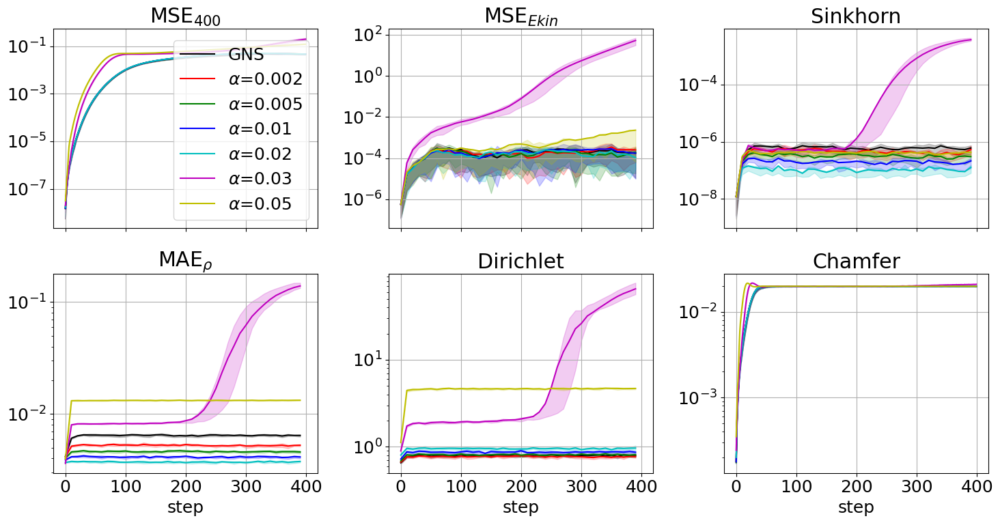

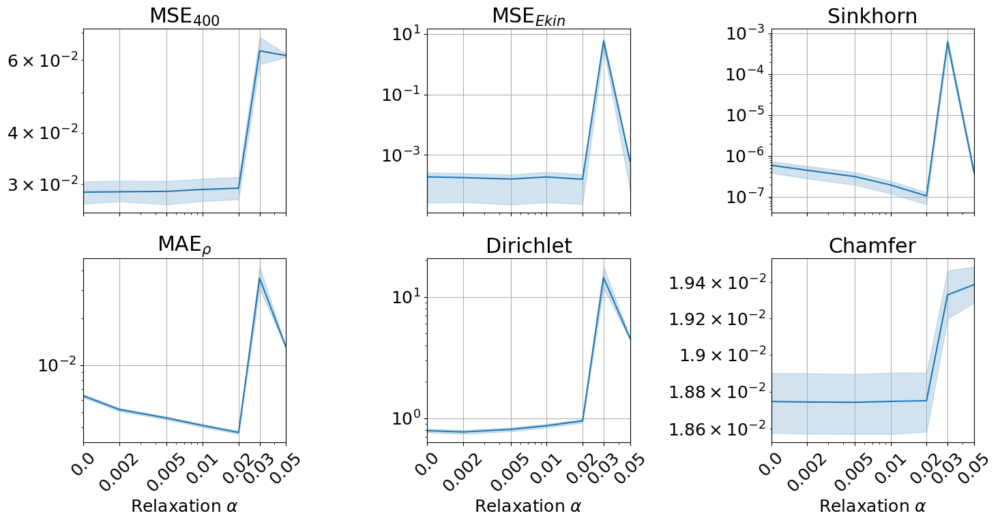

In [3]:
# dirs = ["_0", "_1_0001", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
# labels = ["GNS", r"$\alpha$=0.001", r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
dirs = ["_0", "_1_0002",  "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
labels = ["GNS", r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas")
# x_axis = [5.e-4, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
x_axis = [1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
x_ticklabels = [0.0, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
x_label = r"Relaxation $\alpha$"
plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, log=[True, True], 
                 rotate_x_ticks=True, save_name="alphas_ave")

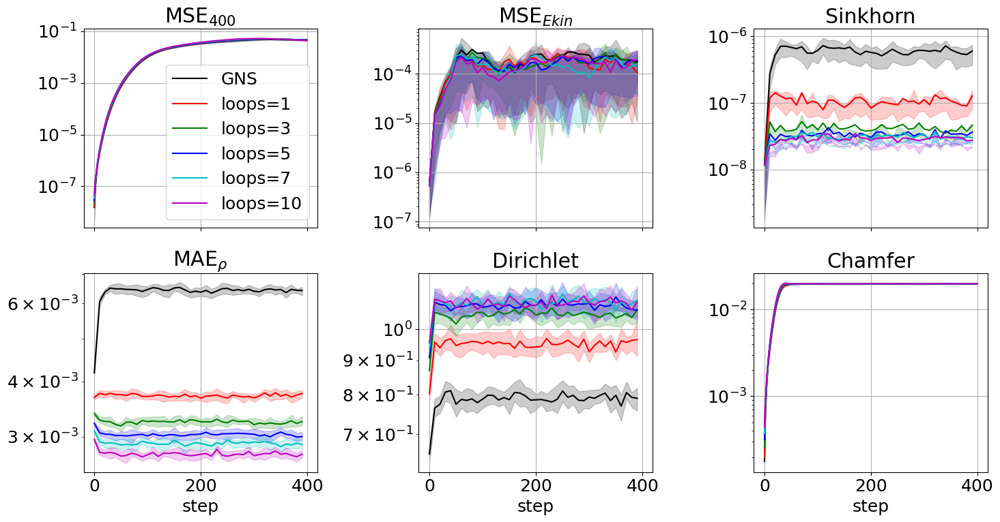

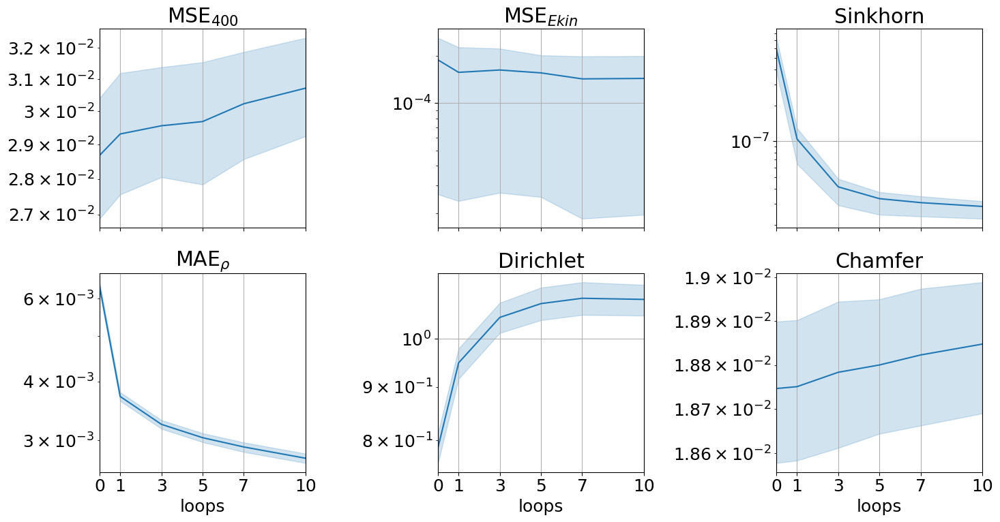

In [4]:
dirs = ["_0", "_1_002", "_3_002", "_5_002", "_7_002", "_10_002"]
labels = ["GNS", "loops=1", "loops=3", "loops=5", "loops=7", "loops=10"]
plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas")
x_axis = [0, 1, 3, 5, 7, 10]
plot_grid_search(rlt_dir, dirs, x_axis, x_label="loops", log=[False, True],
                 save_name="alphas_ave")

## F_ext

In [5]:
# trajs for paper table:
for test_i in ["_prev_0", "_ext_0", "_ex2_0", "_ex2_3_002", "_ex2_3_002_02"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])

['val/loss: 2.7e-02', 'val/sinkhorn: 3.5e-07', 'val/e_kin: 4.3e-03']
['val/loss: 3.1e-02', 'val/sinkhorn: 3.2e-07', 'val/e_kin: 6.2e-04']
['val/loss: 2.6e-02', 'val/sinkhorn: 2.7e-07', 'val/e_kin: 4.3e-04']
['val/loss: 2.6e-02', 'val/sinkhorn: 2.9e-08', 'val/e_kin: 4.5e-04']
['val/loss: 2.7e-02', 'val/sinkhorn: 3.0e-08', 'val/e_kin: 1.2e-04']


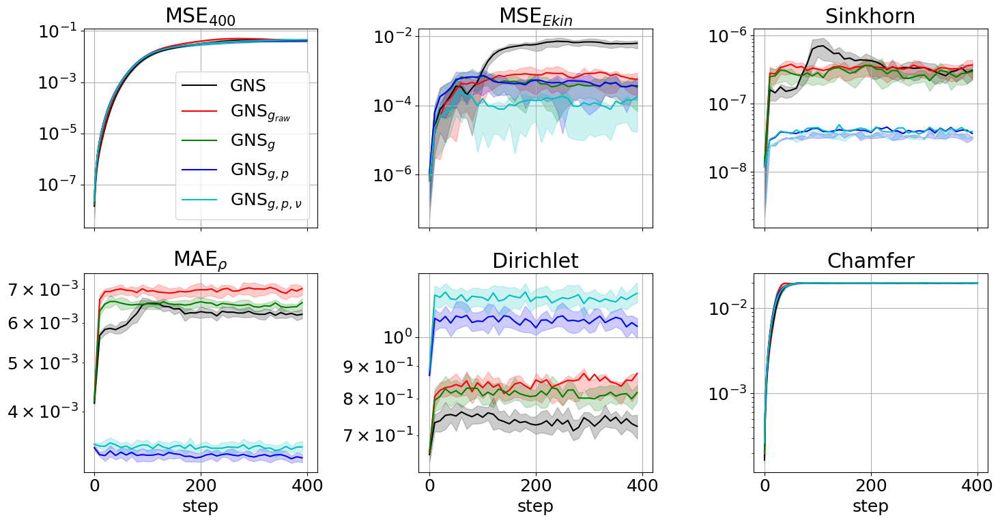

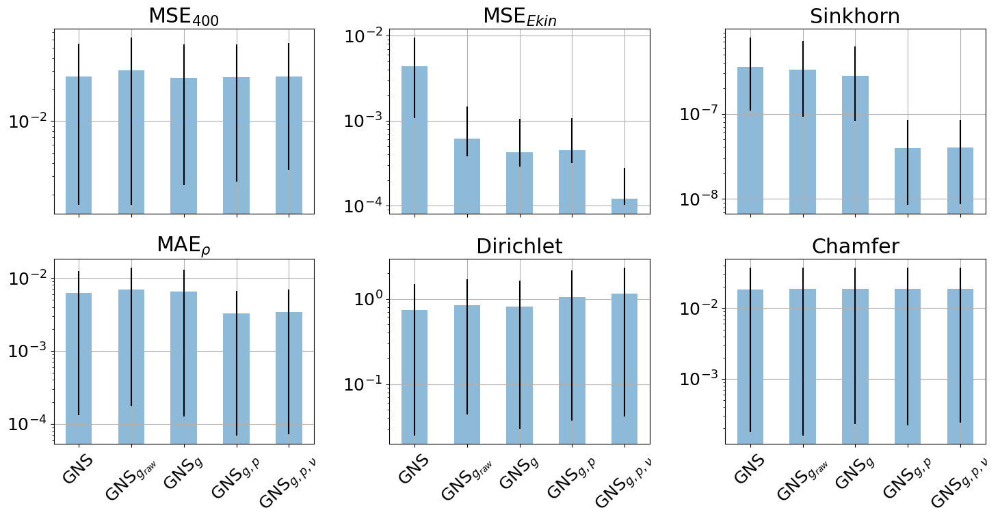

In [6]:
# Future work: investigate too good GNS checkpoint from LagrangeBench
# The original checkpoint performs much worse
# We probably need confidence bounds over multiple model seeds

def ablate_rpf2d(rlt_dir):
    bl = "SEGNN" if "segnn" in rlt_dir.lower() else "GNS"  # baseline
    if bl == "GNS":
        dirs = ["_prev_0", "_ext_0", "_ex2_0", "_ex2_3_002", "_ex2_3_002_02"]
        # rotate = False
    elif bl == "SEGNN":
       dirs = ["_0", "_ext_0", "_ex2_0", "_ex2_3_002", "_ex2_3_002_02"]
    rotate = 45
    labels = [bl, bl + r"$_{g_{raw}}$", bl + r"$_{g}$", bl + r"$_{g,p}$", bl + r"$_{g,p,\nu}$"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="ext")
    plot_grid_search_bars(rlt_dir, dirs, labels, rotate_x_ticks=rotate, save_name="ext_bars")


ablate_rpf2d(rlt_dir)

# 2D RPF SEGNN

In [7]:
rlt_dir = "../rlt/rpf2d_segnn"

# trajs for paper table:
for test_i in ["_0", "_ext_0", "_ex2_0", "_ex2_3_002", "_ex2_3_002_02"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])

['val/loss: 2.5e-02', 'val/sinkhorn: 3.4e-07', 'val/e_kin: 1.5e-04']
['val/loss: 3.0e-02', 'val/sinkhorn: 5.2e-06', 'val/e_kin: 2.3e+03']
['val/loss: 2.8e-02', 'val/sinkhorn: 3.4e-07', 'val/e_kin: 1.2e-04']
['val/loss: 2.8e-02', 'val/sinkhorn: 3.5e-08', 'val/e_kin: 1.4e-04']
['val/loss: 2.8e-02', 'val/sinkhorn: 3.7e-08', 'val/e_kin: 7.3e-04']


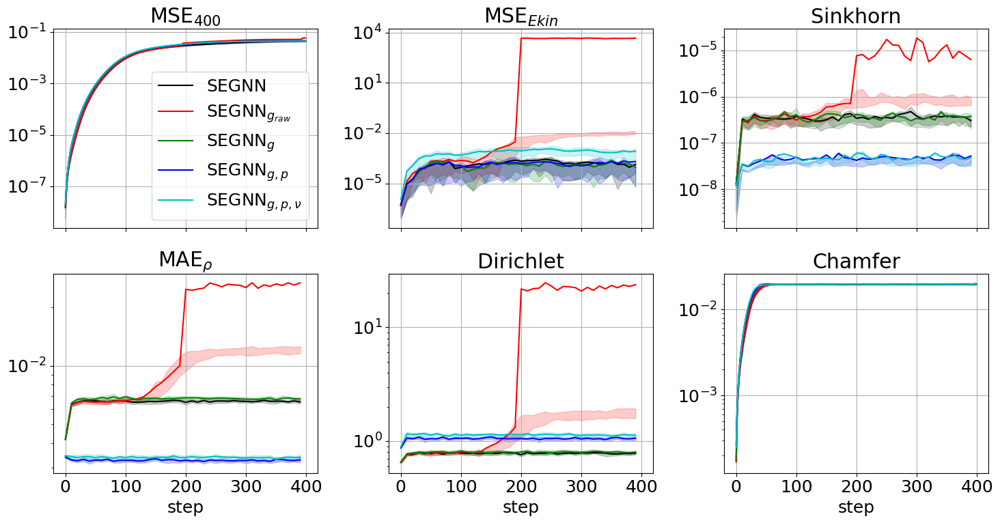

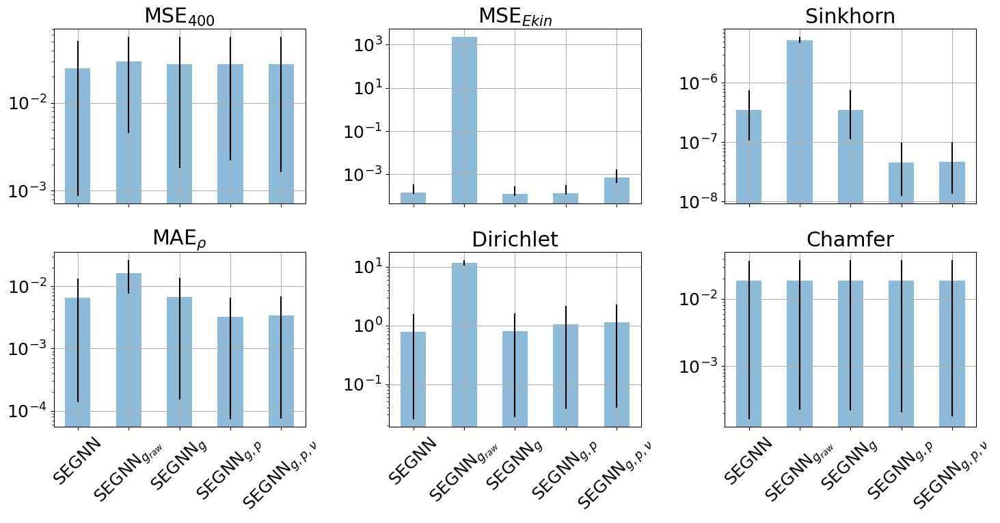

In [8]:
ablate_rpf2d(rlt_dir)

# 3D RPF GNS

In [9]:
def ablate_rpf3d(rlt_dir):
    bl = "SEGNN" if "segnn" in rlt_dir.lower() else "GNS"  # baseline
    rotate = 45
    dirs = ["_0", "_ext_0", "_ex2_0", "_1_0005", "_ex2_1_0005"]
    labels = [bl, bl + r"$_{g_{raw}}$", bl + r"$_{g}$", bl + r"$_{p}$", bl + r"$_{g,p}$"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="ext")
    plot_grid_search_bars(rlt_dir, dirs, labels, rotate_x_ticks=rotate, save_name="ext_bars",
                          lims=[None, None, None, None, None, None])


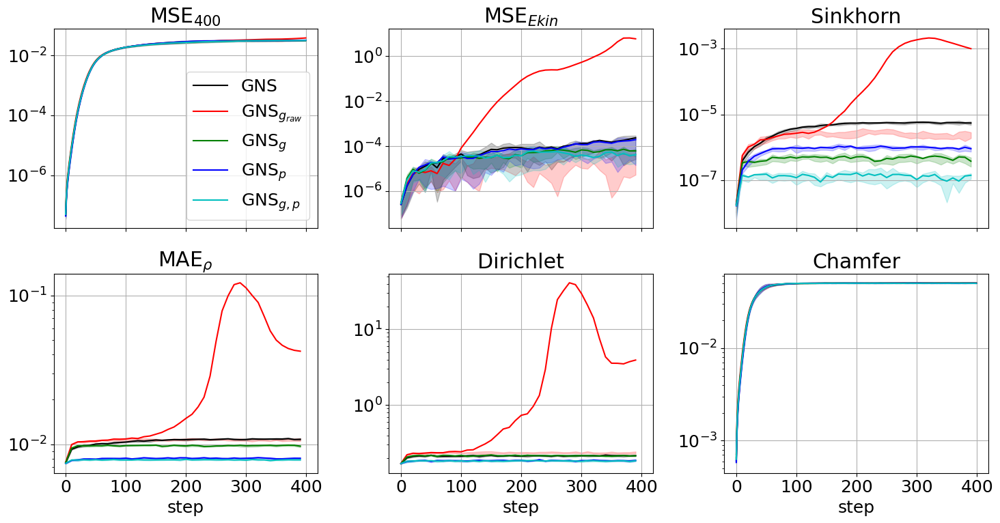

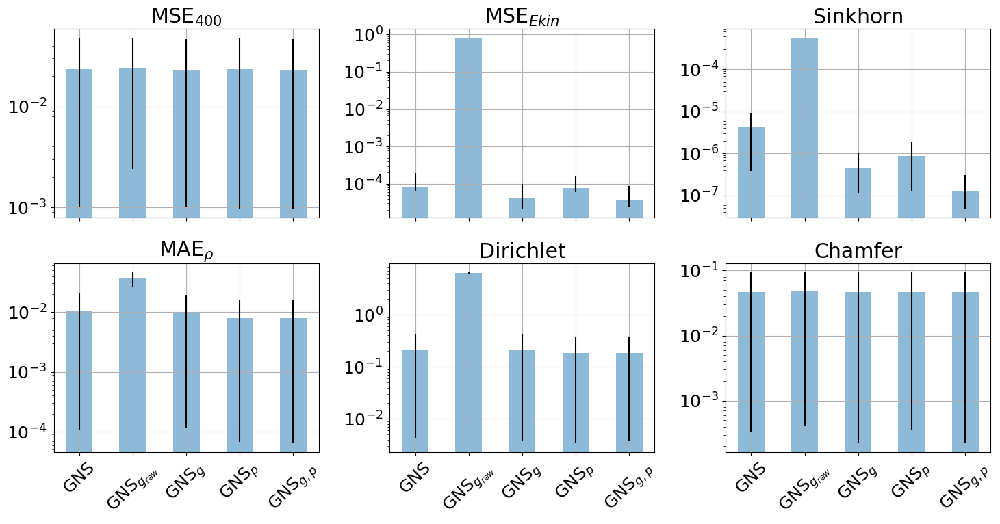

In [10]:
rlt_dir = "../rlt/rpf3d_gns"
ablate_rpf3d(rlt_dir)

# 3D RPF SEGNN

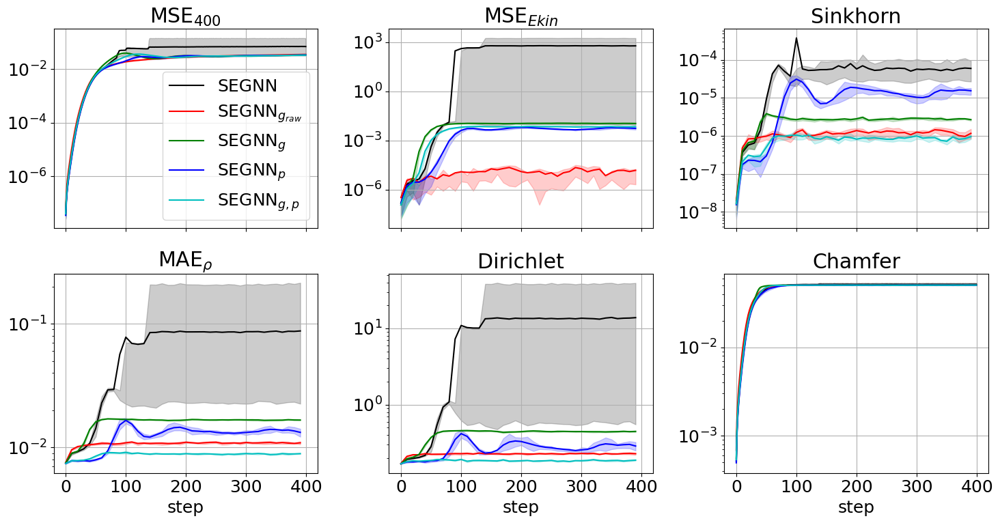

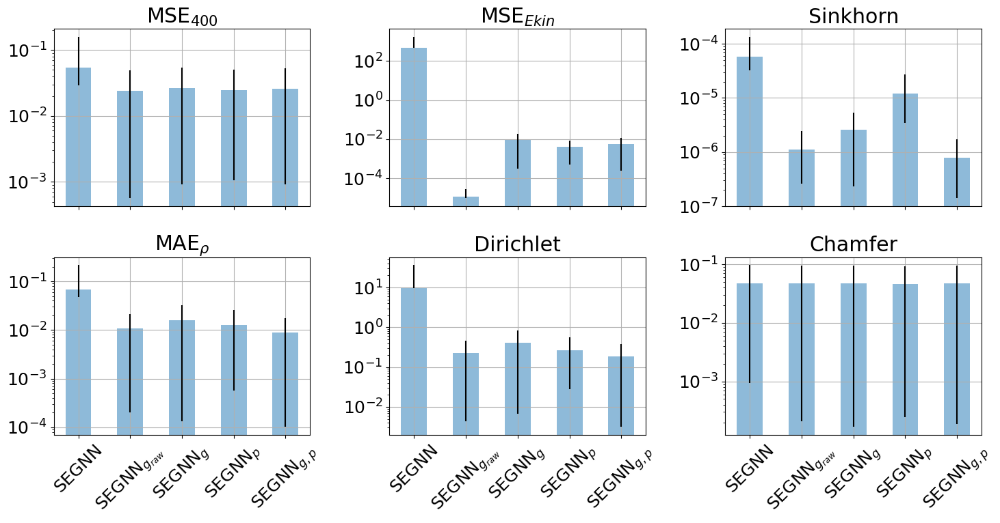

In [11]:
rlt_dir = "../rlt/rpf3d_segnn"
ablate_rpf3d(rlt_dir)

# 2D LDC GNS

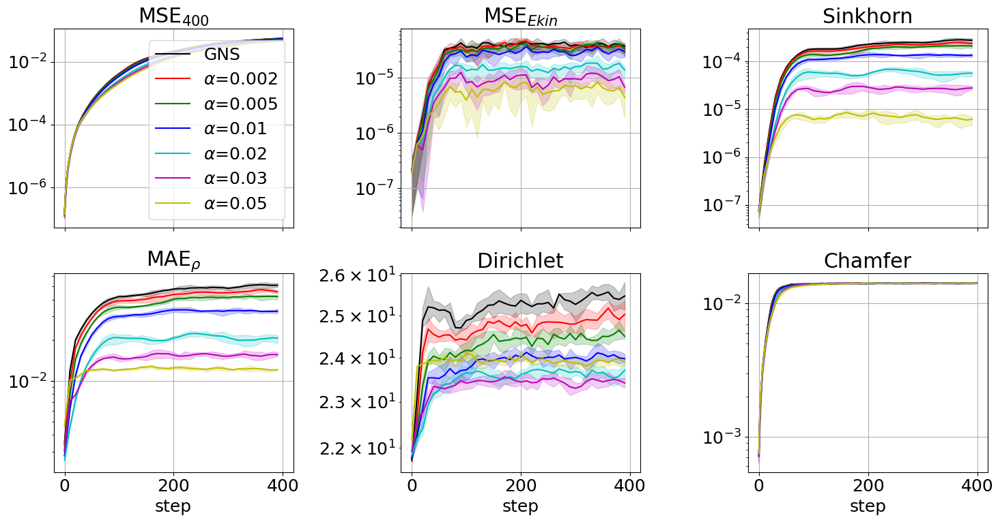

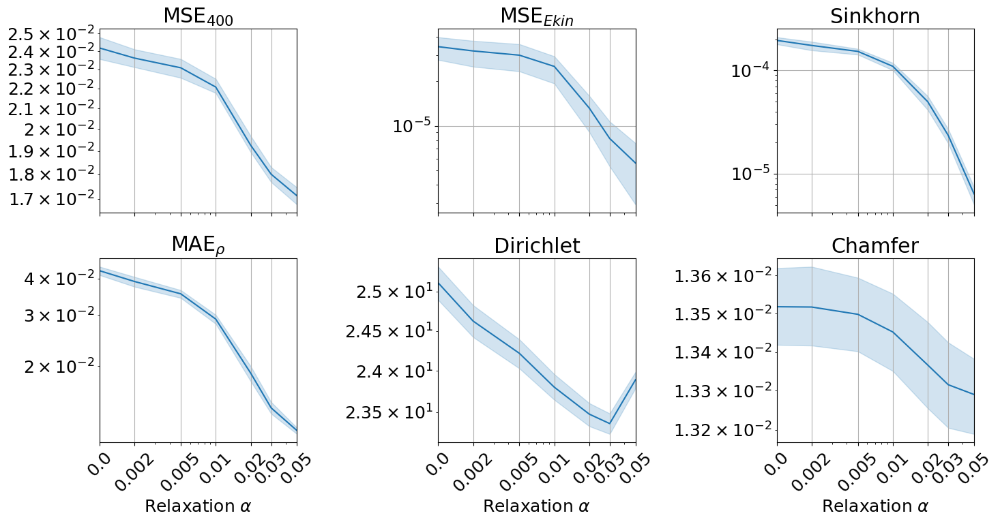

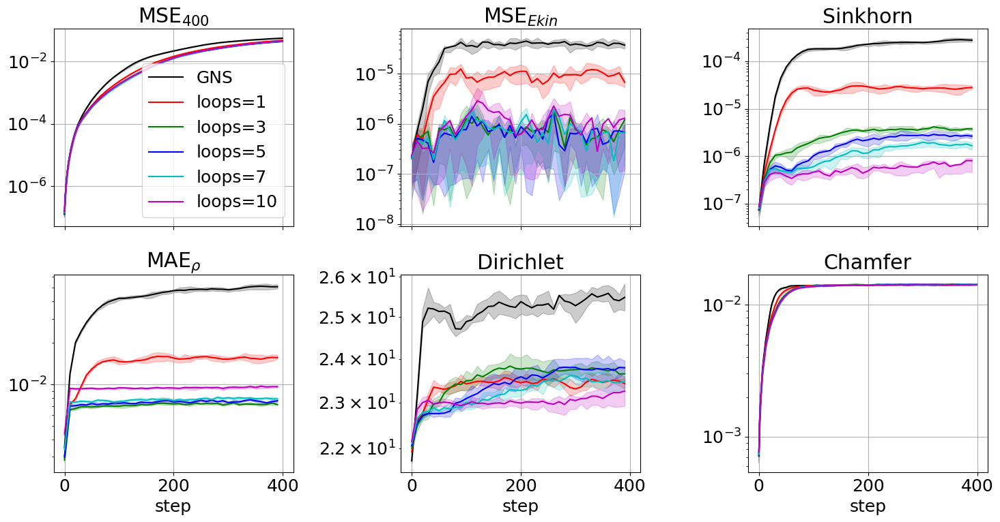

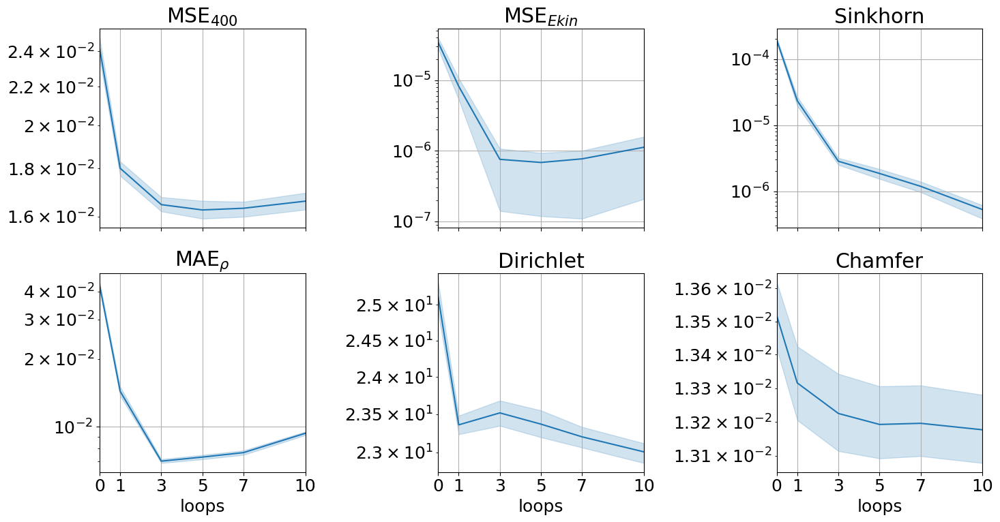

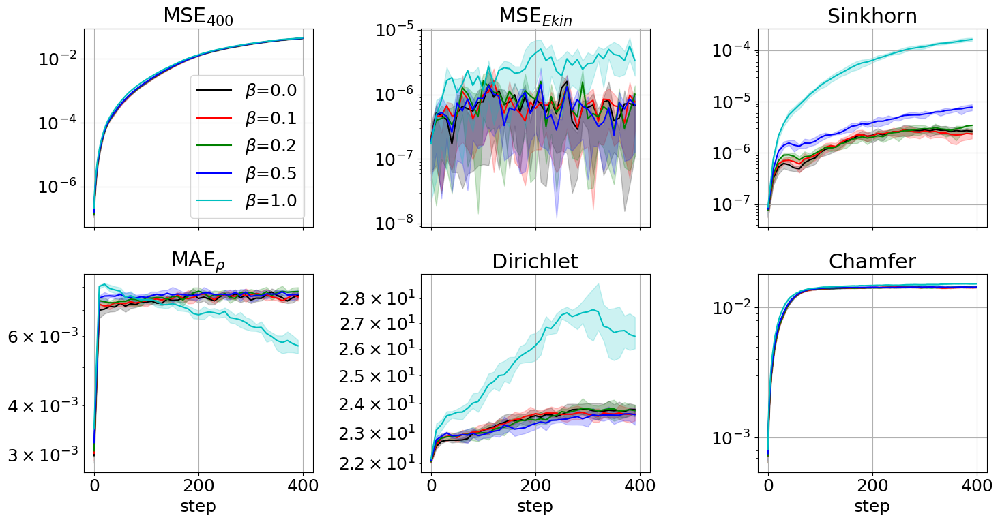

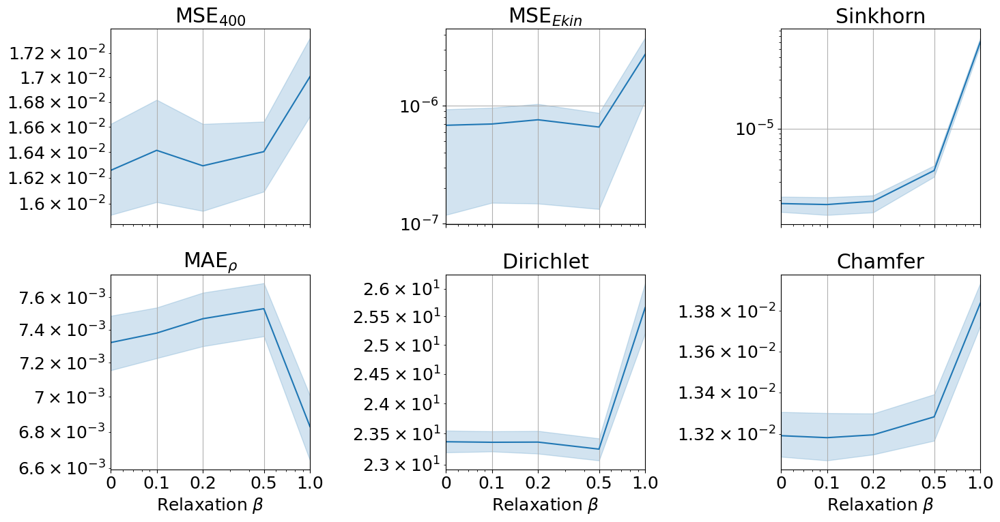

In [12]:
def ablate_rlx_ldc2d(rlt_dir):
    baseline = "SEGNN" if "segnn" in rlt_dir.lower() else "GNS"
    # alphas (acceleration)
    # dirs = ["_0", "_1_0001", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    # labels = [baseline, r"$\alpha$=0.001", r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    dirs = ["_0", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    labels = [baseline, r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas")
    # x_axis = [5.e-4, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    # x_ticklabels = [0.0, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_axis = [1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_ticklabels = [0.0, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_label = r"Relaxation $\alpha$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], rotate_x_ticks=True, save_name="alphas_ave")
    # num loops
    dirs = ["_0", "_1_003", "_3_003", "_5_003", "_7_003", "_10_003"]
    labels = [baseline, "loops=1", "loops=3", "loops=5", "loops=7", "loops=10"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="loops")
    x_axis = [0, 1, 3, 5, 7, 10]
    plot_grid_search(rlt_dir, dirs, x_axis, x_label="loops", log=[False, True],
                    save_name="loops_ave")
    # betas (viscosity)
    dirs = ["_5_003", "_5_003_01", "_5_003_02", "_5_003_05", "_5_003_10"]
    labels = [r"$\beta$=0.0", r"$\beta$=0.1", r"$\beta$=0.2", r"$\beta$=0.5", r"$\beta$=1.0"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="betas")
    x_axis = [0.05, 0.1, 0.2, 0.5, 1.0]
    x_ticklabels = [0, 0.1, 0.2, 0.5, 1.0]
    x_label = r"Relaxation $\beta$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], save_name="betas_ave")

rlt_dir = "../rlt/ldc2d_gns"
dataset_path = "../datasets/2D_LDC_2708_10kevery100"
ablate_rlx_ldc2d(rlt_dir)

## Relaxation training

In [13]:
rlt_dirs = ["../rlt/rlx_ldc2d/rlx_ldc2d_0", "../rlt/rlx_ldc2d/rlx_ldc2d_1"]
for rlt_dir in rlt_dirs:
    print(rlt_dir)
    for test_i in ["_003", "_001", "_00", "_m001", "_m003"]:
        metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/e_kin", "val/sinkhorn"])
        print([f"{k}: {metrics_ave[k]:.3e}" for k, v in metrics_ave.items()])

../rlt/rlx_ldc2d/rlx_ldc2d_0
['val/loss: 7.256e-02', 'val/e_kin: 9.437e-04', 'val/sinkhorn: 1.368e-02']
['val/loss: 4.520e-02', 'val/e_kin: 9.162e-05', 'val/sinkhorn: 9.370e-03']
['val/loss: 2.634e-02', 'val/e_kin: 2.893e-05', 'val/sinkhorn: 3.167e-04']
['val/loss: 4.787e-02', 'val/e_kin: 3.879e-04', 'val/sinkhorn: 1.628e-03']
['val/loss: 3.098e-02', 'val/e_kin: 5.919e-04', 'val/sinkhorn: 4.838e-03']
../rlt/rlx_ldc2d/rlx_ldc2d_1
['val/loss: 1.910e-02', 'val/e_kin: 2.018e-05', 'val/sinkhorn: 2.886e-04']
['val/loss: 1.907e-02', 'val/e_kin: 1.947e-05', 'val/sinkhorn: 8.259e-05']
['val/loss: 2.634e-02', 'val/e_kin: 2.893e-05', 'val/sinkhorn: 3.167e-04']
['val/loss: 5.637e-02', 'val/e_kin: 9.101e-04', 'val/sinkhorn: 8.431e-03']
['val/loss: 8.196e-02', 'val/e_kin: 1.653e-02', 'val/sinkhorn: 1.355e-02']


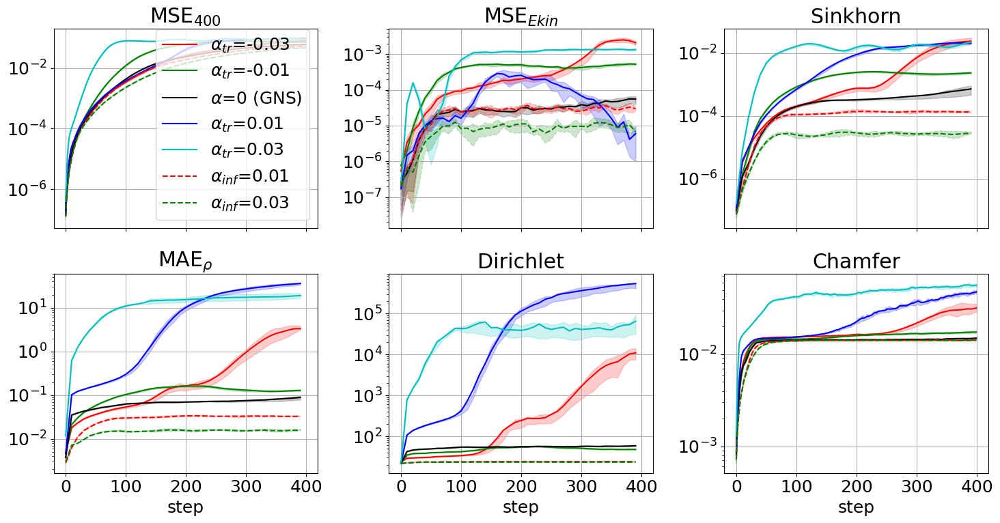

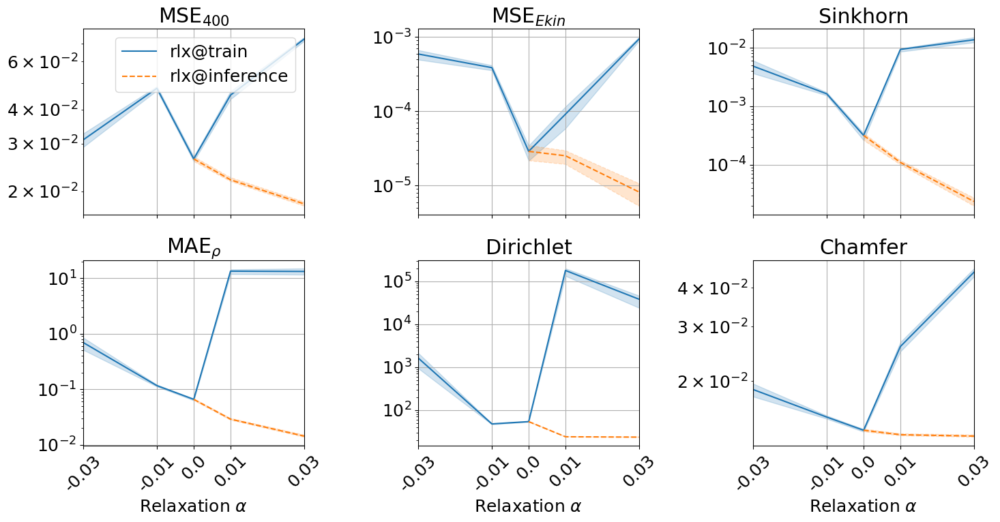

In [14]:
# def ablate_rlx_training_ldc2d(rlt_dir):
#     # alphas (acceleration)
#     dirs = ["_m003", "_m001", "_00", "_001", "_003"] # ,"_002"]
#     labels = [r"$\alpha_{tr}$=-0.03", r"$\alpha_{tr}$=-0.01", r"$\alpha$=0 (GNS)", r"$\alpha_{tr}$=0.01", r"$\alpha_{tr}$=0.03"] # , r"$\alpha$=0.02"
#     c_order = [1, 2, 0, 3, 4]  # , 5
#     plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas", c_order=c_order)
#     x_axis = [-0.03, -0.01, 0.0, 0.01, 0.03]  # , 0.02]
#     x_ticklabels = x_axis
#     x_label = r"Relaxation $\alpha$"
#     plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
#                      log=[False, True], rotate_x_ticks=True, save_name="alphas_ave")
# ablate_rlx_training_ldc2d("../rlt/rlx_ldc2d/rlx_ldc2d_0")

def ablate_rlx_training_ldc2d_s(rlt_dir):
    # alphas (acceleration)
    dirs = [["_m003", "_m001", "_00", "_001", "_003"], ["_1_001", "_1_003"]] # ,"_002"]
    if "rlx_ldc2d_1" in rlt_dir[0]:
        labels = [[r"$\alpha_{tr,inf}$=-0.03", r"$\alpha_{tr,inf}$=-0.01", r"$\alpha$=0 (GNS)", r"$\alpha_{tr,inf}$=0.01", r"$\alpha_{tr,inf}$=0.03"], [r"$\alpha_{inf}$=0.01", r"$\alpha_{inf}$=0.03"]] # , r"$\alpha$=0.02"
    else:
        labels = [[r"$\alpha_{tr}$=-0.03", r"$\alpha_{tr}$=-0.01", r"$\alpha$=0 (GNS)", r"$\alpha_{tr}$=0.01", r"$\alpha_{tr}$=0.03"], [r"$\alpha_{inf}$=0.01", r"$\alpha_{inf}$=0.03"]] # , r"$\alpha$=0.02"
    c_order = [1, 2, 0, 3, 4]  # , 5
    plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas", c_order=c_order)
    dirs = [["_m003", "_m001", "_00", "_001", "_003"], ["_00_rlx_ldc2d", "_1_001", "_1_003"]] # ,"_002"]
    x_axis = [[-0.03, -0.01, 0.0, 0.01, 0.03],[0.0, 0.01, 0.03]]  # , 0.02]
    x_ticklabels = x_axis[0]
    x_label = r"Relaxation $\alpha$"
    labels = ["rlx@train", "rlx@inference"]
    if "rlx_ldc2d_1" in rlt_dir[0]:
        labels[0] = "rlx@tr&inf"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[False, True], rotate_x_ticks=True, save_name="alphas_ave",
                     labels = labels)
 
# dirs_dict = {
#     0.03: 'gns_ldc2d_20240328-215547',
#     0.02: 'gns_ldc2d_20240328-220043',
#     0.01: 'gns_ldc2d_20240328-220053',
#     0.0: 'gns_ldc2d_20240328-220101',
#     -0.01: 'gns_ldc2d_20240328-220116',
#     -0.03: 'gns_ldc2d_20240328-220201',
# }
ablate_rlx_training_ldc2d_s(["../rlt/rlx_ldc2d/rlx_ldc2d_0", "../rlt/ldc2d_gns"])

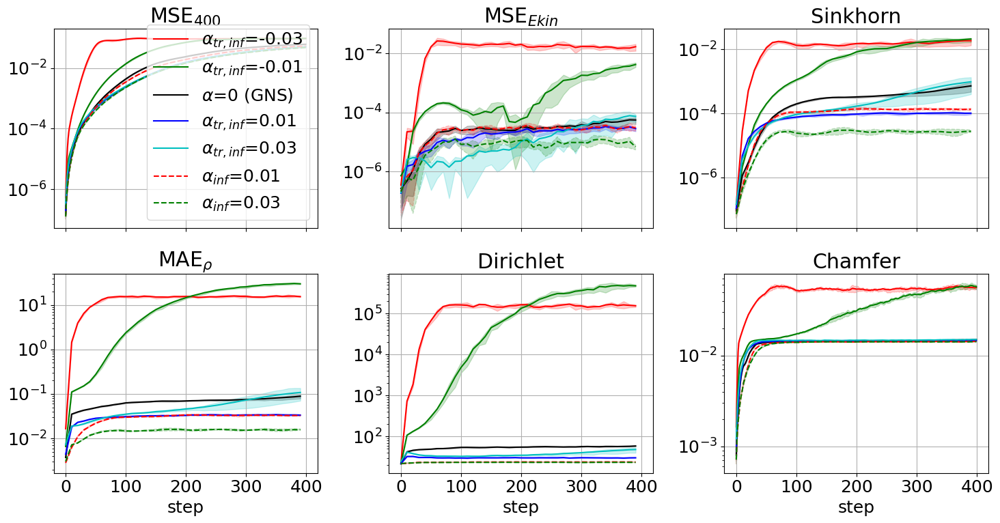

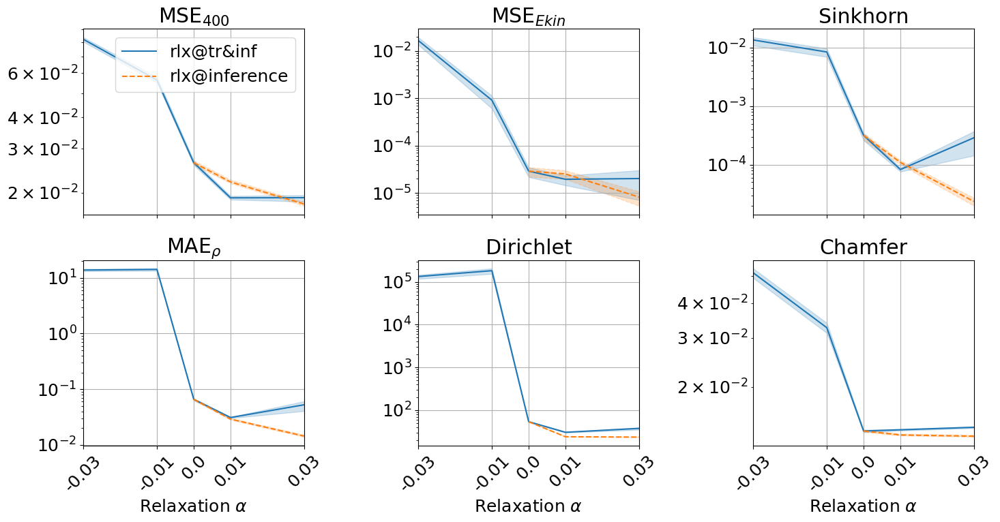

In [15]:
ablate_rlx_training_ldc2d_s(["../rlt/rlx_ldc2d/rlx_ldc2d_1", "../rlt/ldc2d_gns"])

# 2D LDC SEGNN

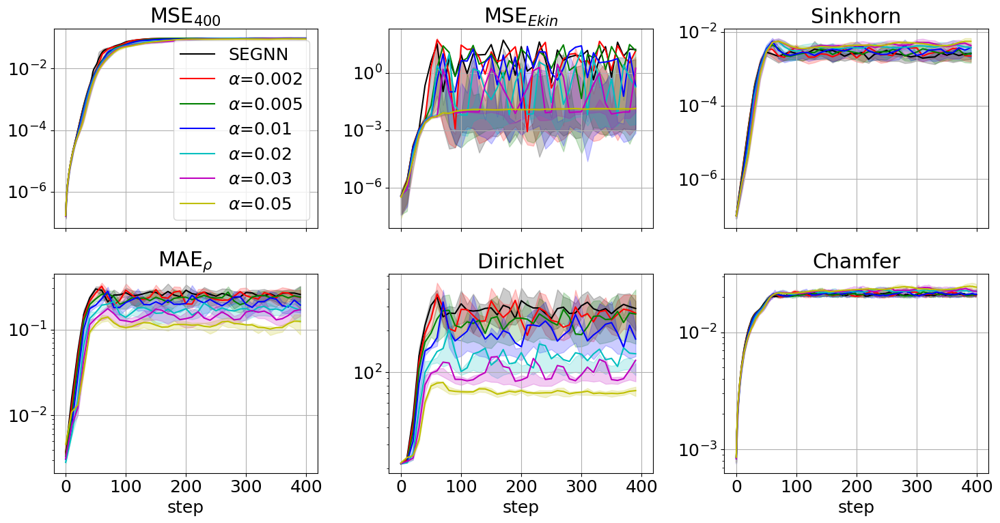

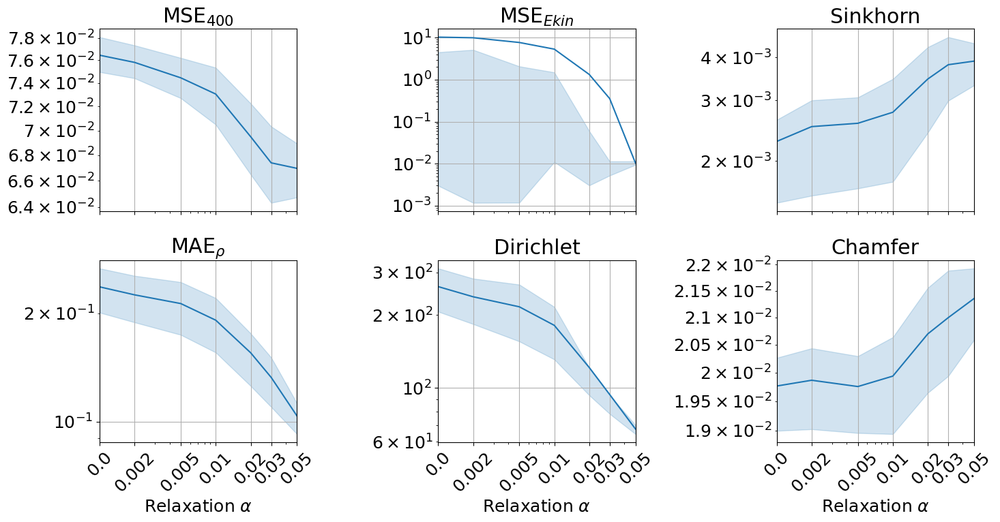

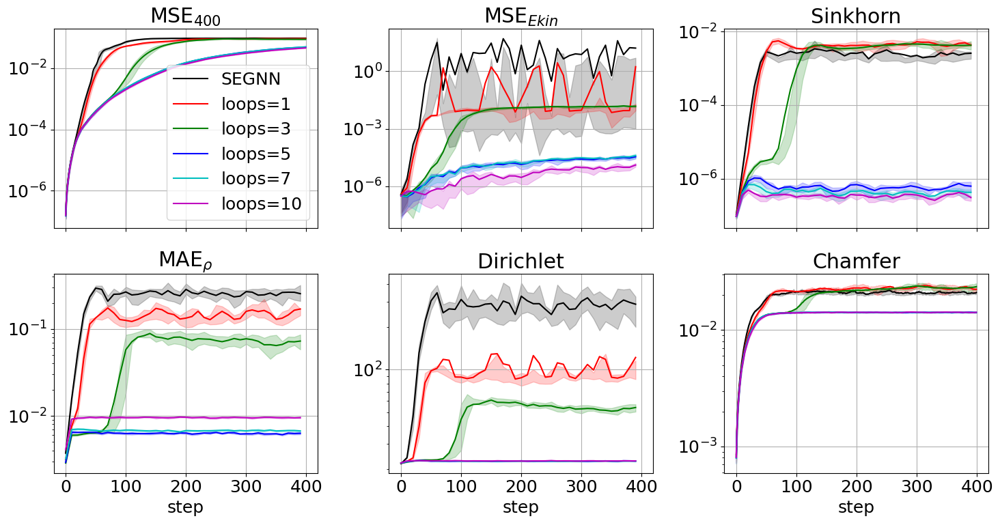

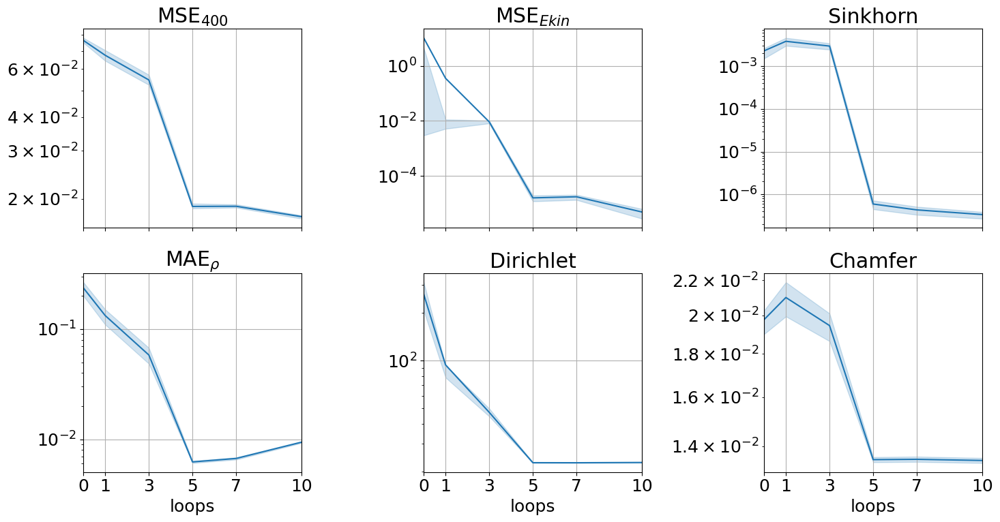

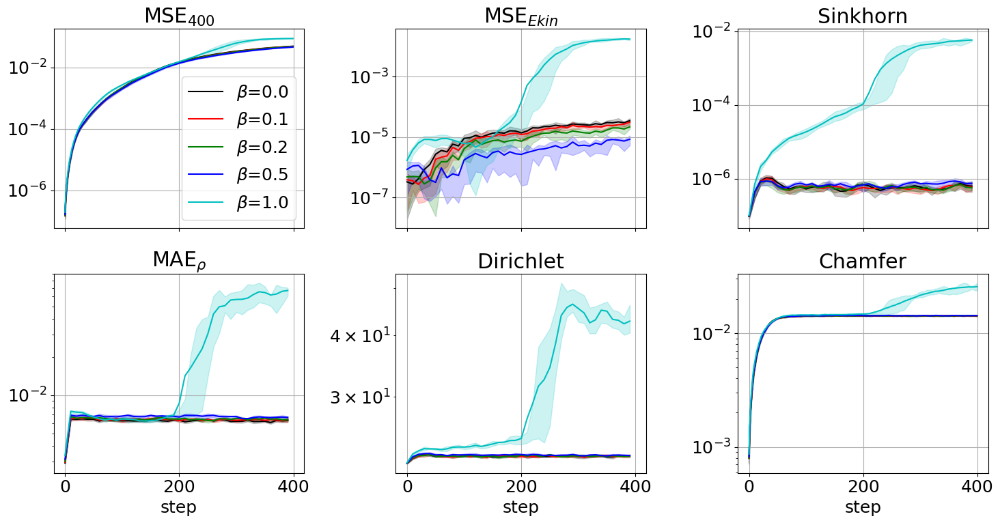

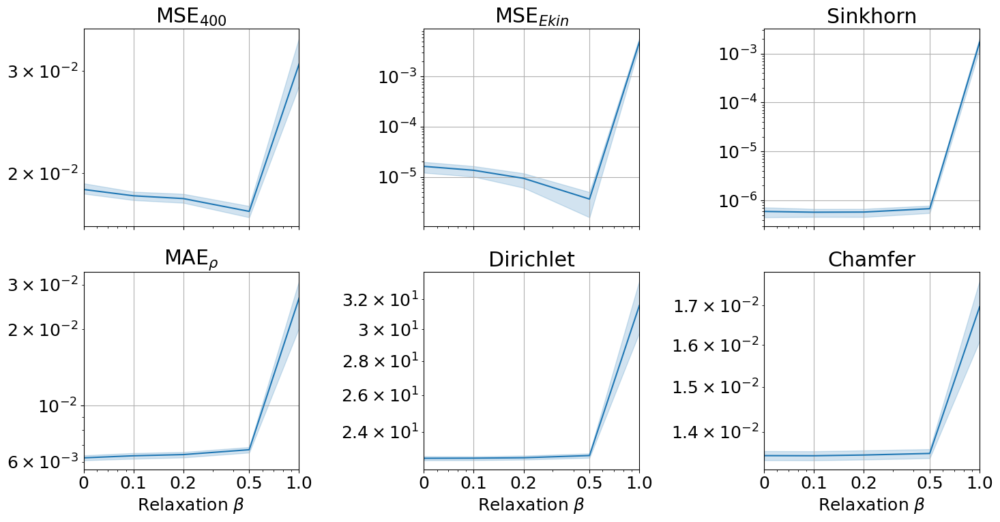

In [16]:
rlt_dir = "../rlt/ldc2d_segnn"
dataset_path = "../datasets/2D_LDC_2708_10kevery100"
ablate_rlx_ldc2d(rlt_dir)

# 3D LDC GNS

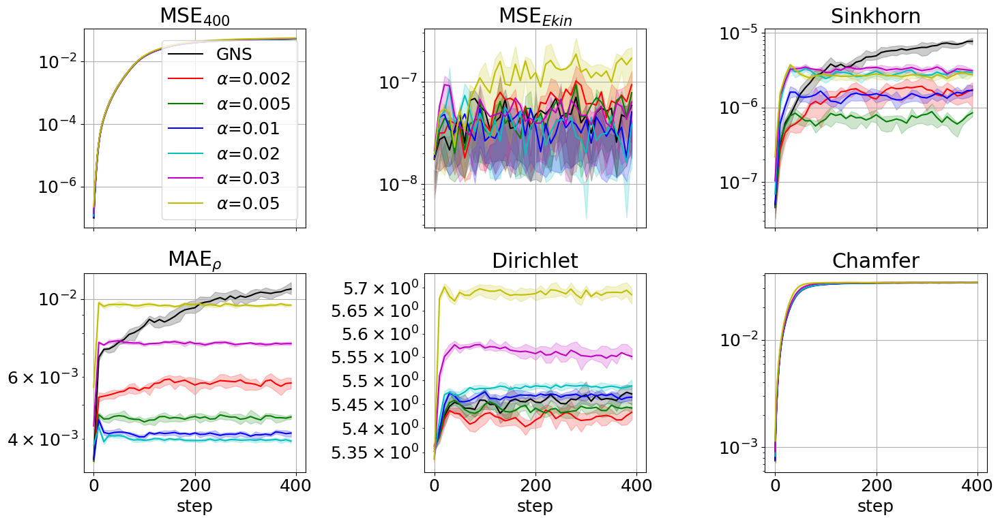

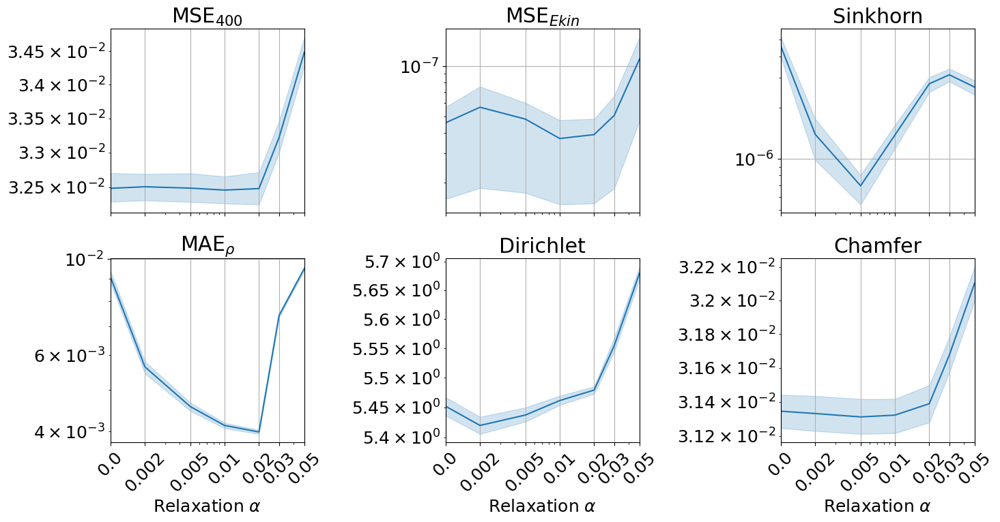

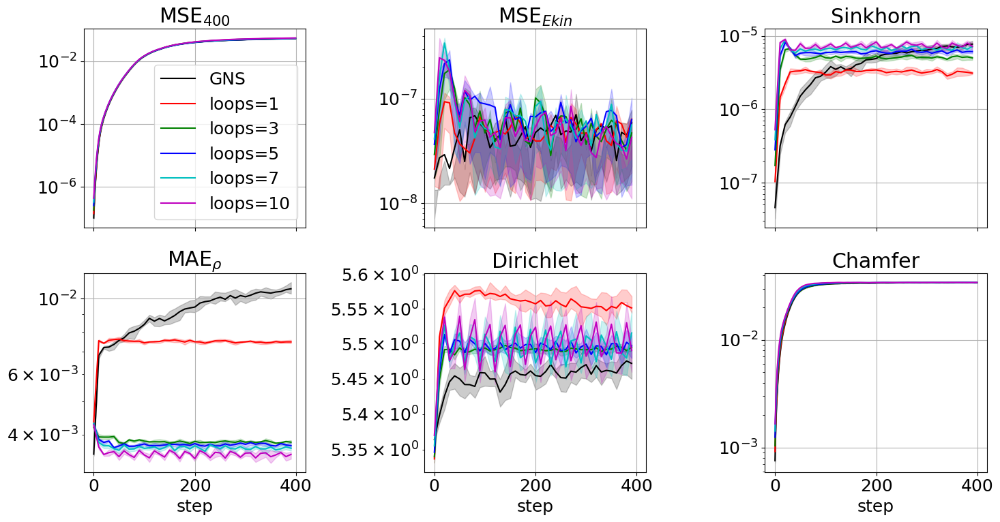

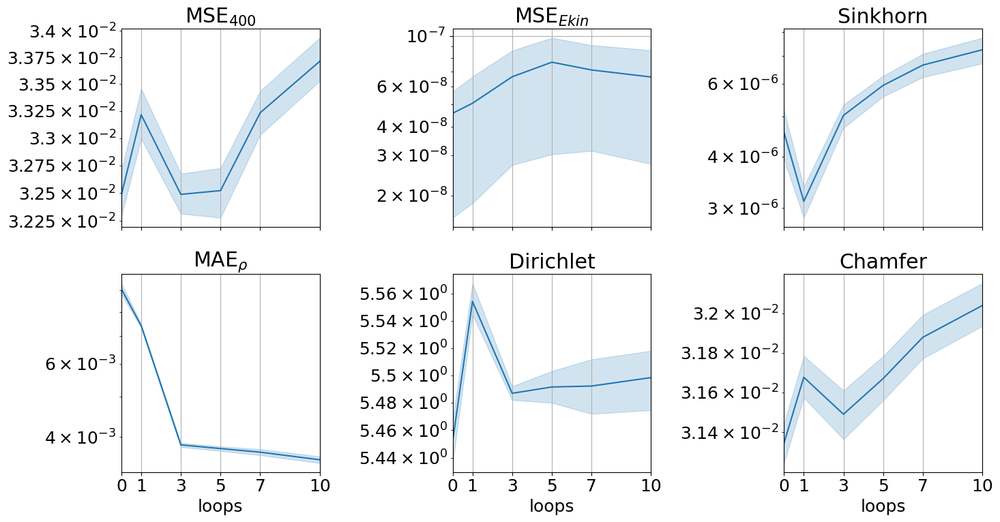

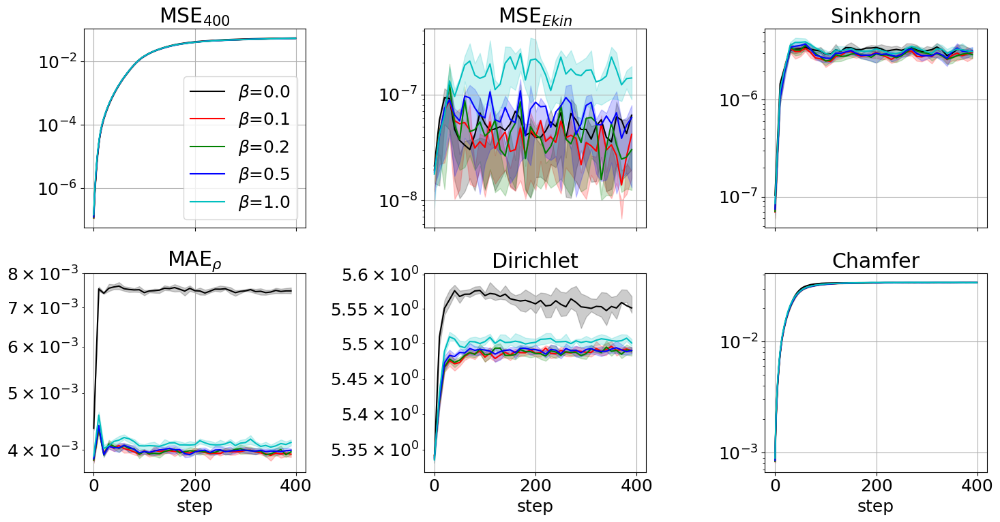

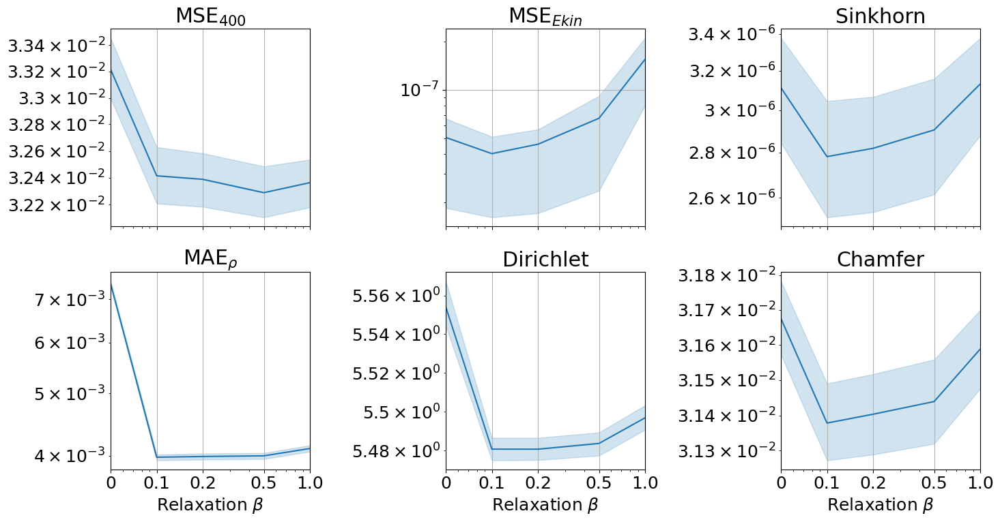

In [17]:
rlt_dir = "../rlt/ldc3d_gns"
dataset_path = "../datasets/3D_LDC_8160_10kevery100"

def ablate_rlx_ldc3d(rlt_dir):
    baseline = "SEGNN" if "segnn" in rlt_dir.lower() else "GNS"
    # alphas (acceleration)
    # dirs = ["_0", "_1_0001", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    # labels = [baseline, r"$\alpha$=0.001", r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    dirs = ["_0", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    labels = [baseline, r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas")
    # x_axis = [5.e-4, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    # x_ticklabels = [0.0, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_axis = [1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_ticklabels = [0.0, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_label = r"Relaxation $\alpha$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], rotate_x_ticks=True, save_name="alphas_ave")
    # num loops
    dirs = ["_0", "_1_003", "_3_002", "_5_002", "_7_002", "_10_002"]
    labels = [baseline, "loops=1", "loops=3", "loops=5", "loops=7", "loops=10"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="loops")
    x_axis = [0, 1, 3, 5, 7, 10]
    plot_grid_search(rlt_dir, dirs, x_axis, x_label="loops", log=[False, True],
                    save_name="loops_ave")
    # betas (viscosity)
    dirs = ["_1_003", "_1_002_01", "_1_002_02", "_1_002_05", "_1_002_10"]
    labels = [r"$\beta$=0.0", r"$\beta$=0.1", r"$\beta$=0.2", r"$\beta$=0.5", r"$\beta$=1.0"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="betas")
    x_axis = [0.05, 0.1, 0.2, 0.5, 1.0]
    x_ticklabels = [0, 0.1, 0.2, 0.5, 1.0]
    x_label = r"Relaxation $\beta$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], save_name="betas_ave")

ablate_rlx_ldc3d(rlt_dir)

# 3D LDC SEGNN

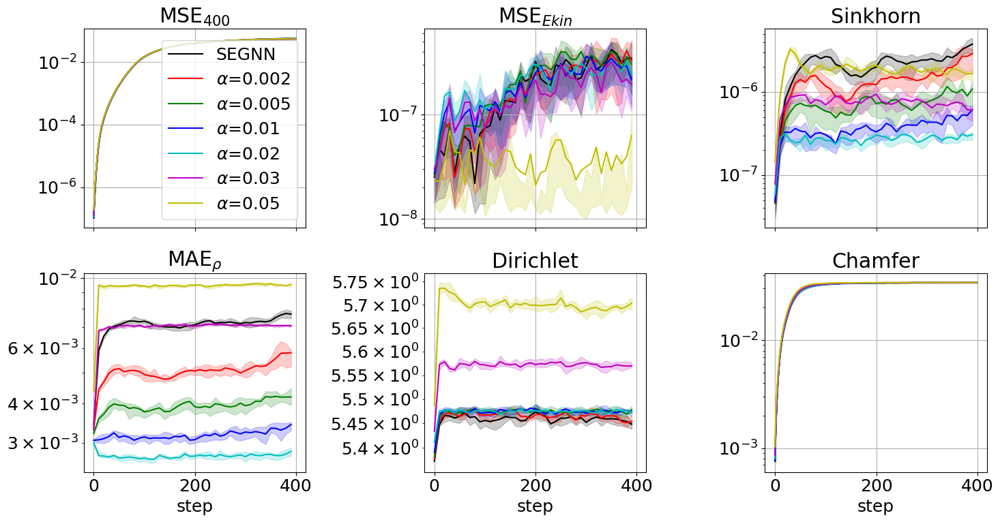

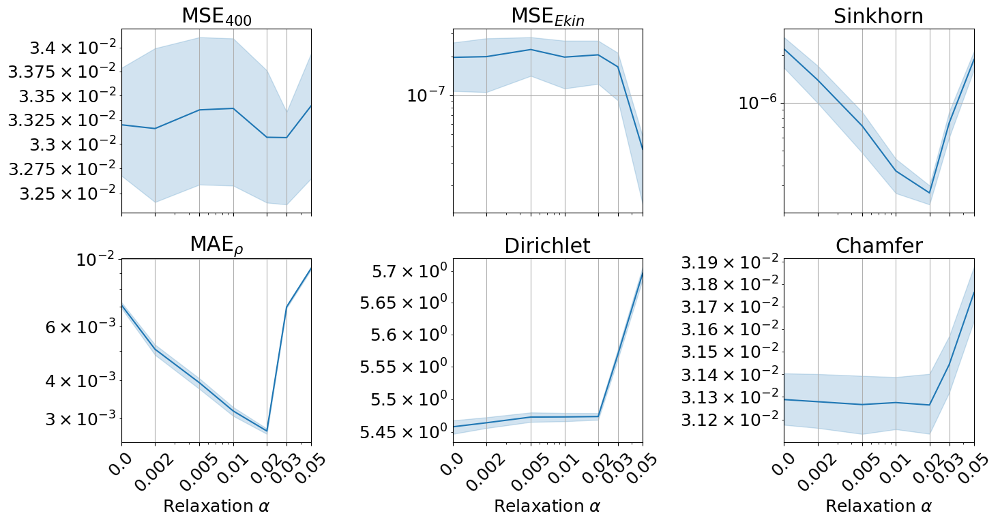

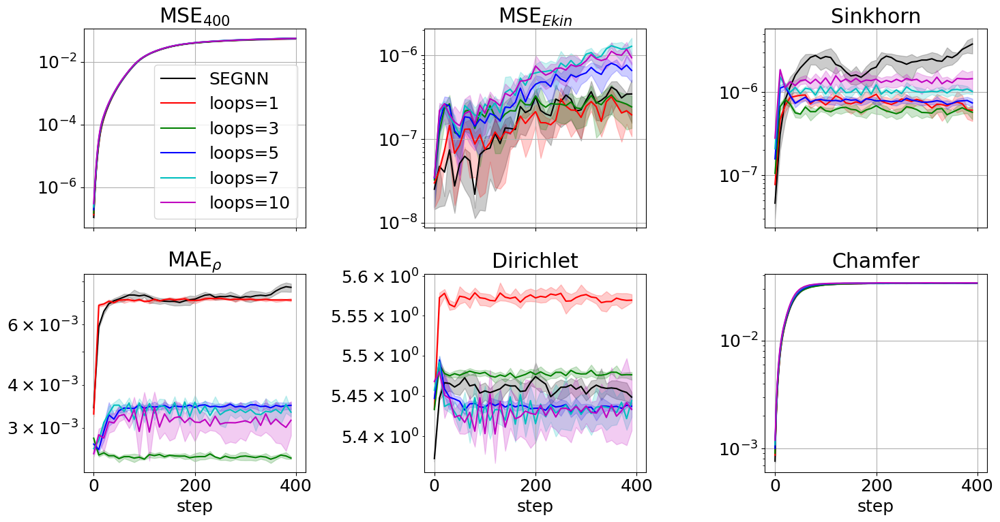

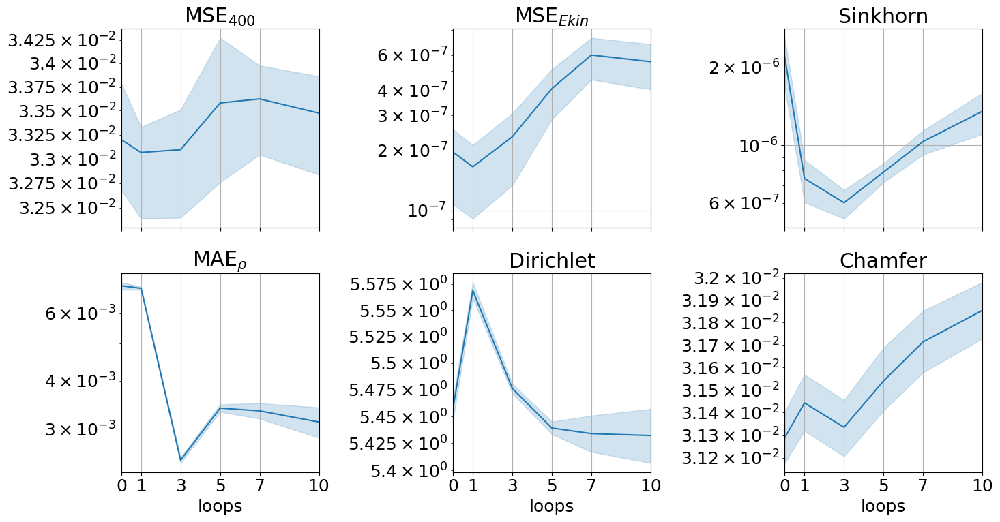

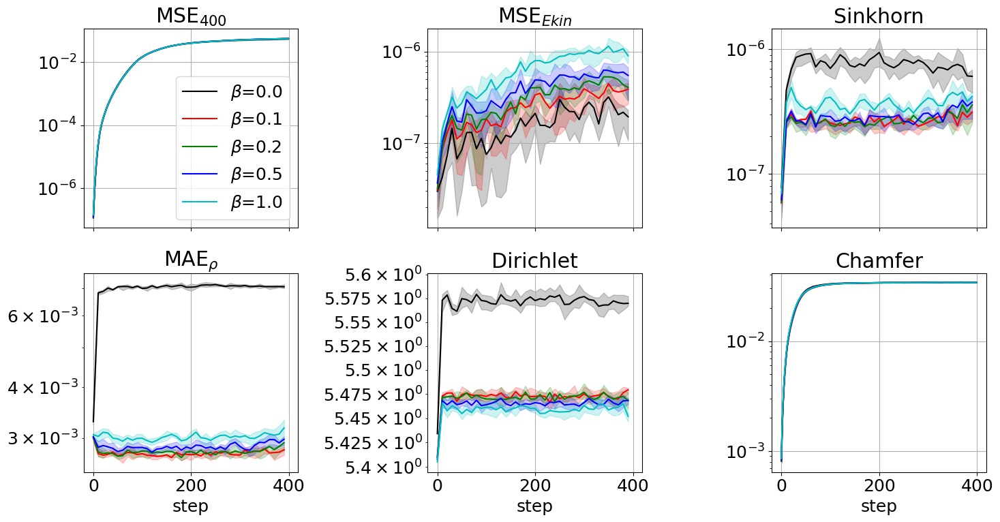

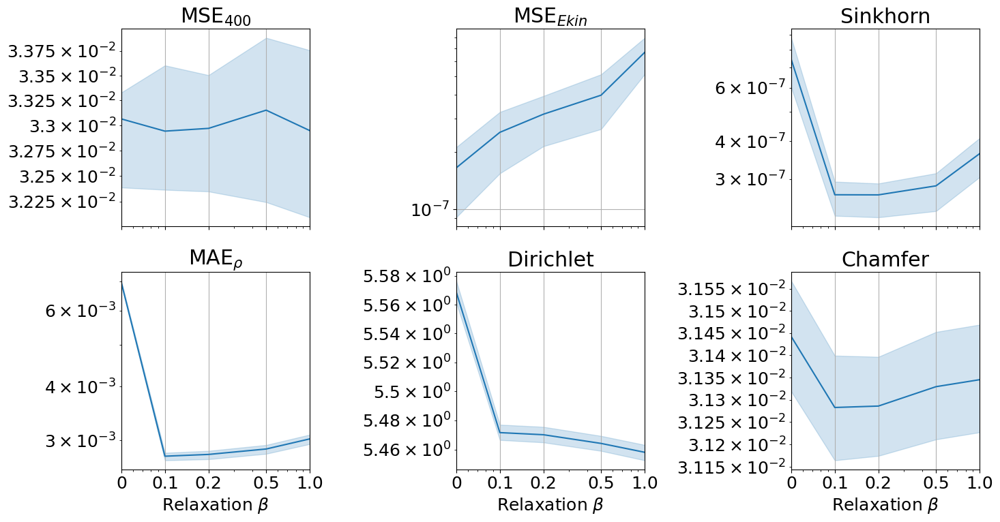

In [18]:
rlt_dir = "../rlt/ldc3d_segnn"
dataset_path = "../datasets/3D_LDC_8160_10kevery100"
ablate_rlx_ldc3d(rlt_dir)

# 2D TGV GNS

In [19]:
rlt_dir = "../rlt/tgv2d_gns"

# trajs for paper table:
for test_i in ["_0", "_5_002"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])

['val/loss: 5.3e-04', 'val/sinkhorn: 5.4e-07', 'val/e_kin: 5.6e-07']
['val/loss: 4.8e-04', 'val/sinkhorn: 1.7e-08', 'val/e_kin: 4.8e-07']


In [20]:
def ablate_rlx_tgv2d(rlt_dir):
    baseline = "SEGNN" if "segnn" in rlt_dir.lower() else "GNS"
    # alphas (acceleration)
    # dirs = ["_0", "_1_0001", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    # labels = [baseline, r"$\alpha$=0.001", r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    dirs = ["_0", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    labels = [baseline, r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas")
    # x_axis = [5.e-4, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    # x_ticklabels = [0.0, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_axis = [1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_ticklabels = [0.0, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_label = r"Relaxation $\alpha$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], rotate_x_ticks=True, save_name="alphas_ave")
    # num loops
    dirs = ["_0", "_1_002", "_3_002", "_5_002", "_7_002", "_10_002"]
    labels = [baseline, "loops=1", "loops=3", "loops=5", "loops=7", "loops=10"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="loops")
    x_axis = [0, 1, 3, 5, 7, 10]
    plot_grid_search(rlt_dir, dirs, x_axis, x_label="loops", log=[False, True],
                    save_name="loops_ave")
    # betas (viscosity)
    dirs = ["_5_002", "_5_002_01", "_5_002_02", "_5_002_05", "_5_002_10"]
    labels = [r"$\beta$=0.0", r"$\beta$=0.1", r"$\beta$=0.2", r"$\beta$=0.5", r"$\beta$=1.0"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="betas")
    x_axis = [0.05, 0.1, 0.2, 0.5, 1.0]
    x_ticklabels = [0, 0.1, 0.2, 0.5, 1.0]
    x_label = r"Relaxation $\beta$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], save_name="betas_ave")

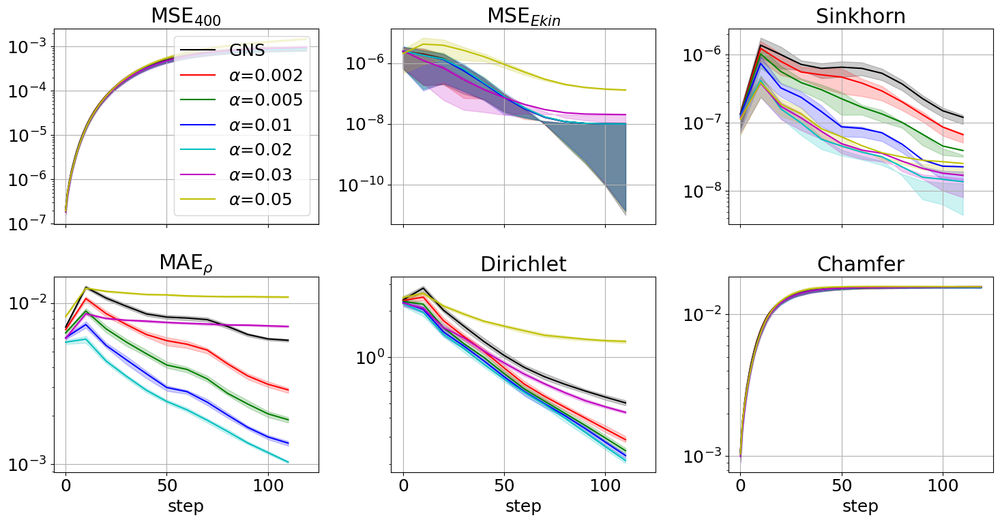

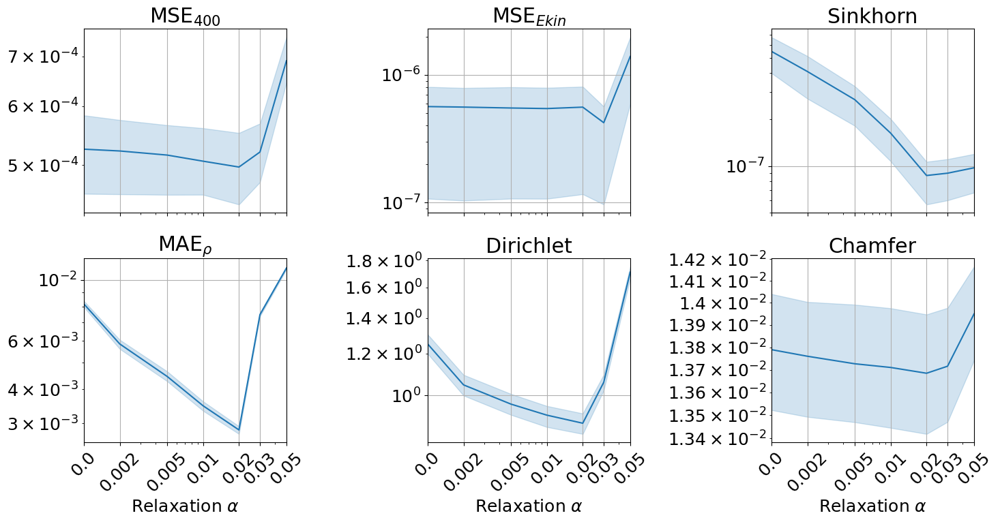

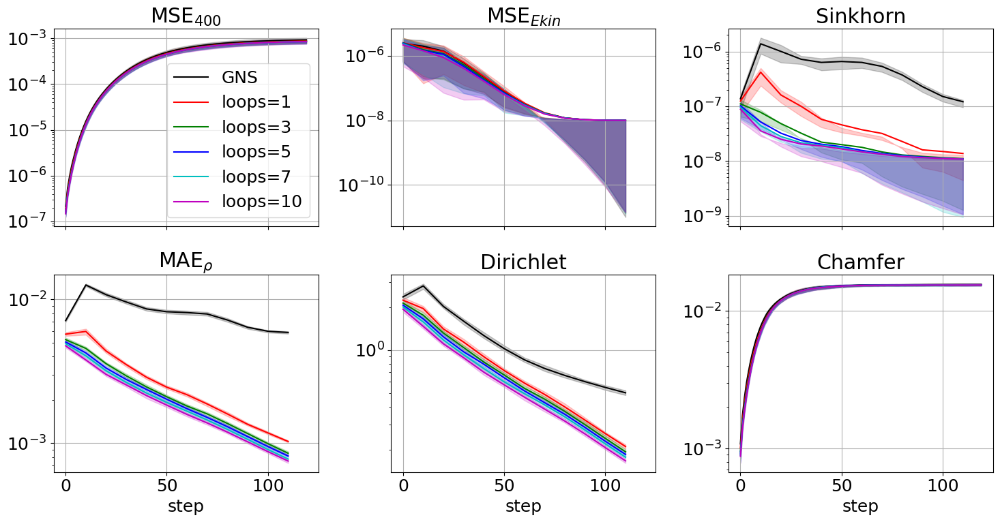

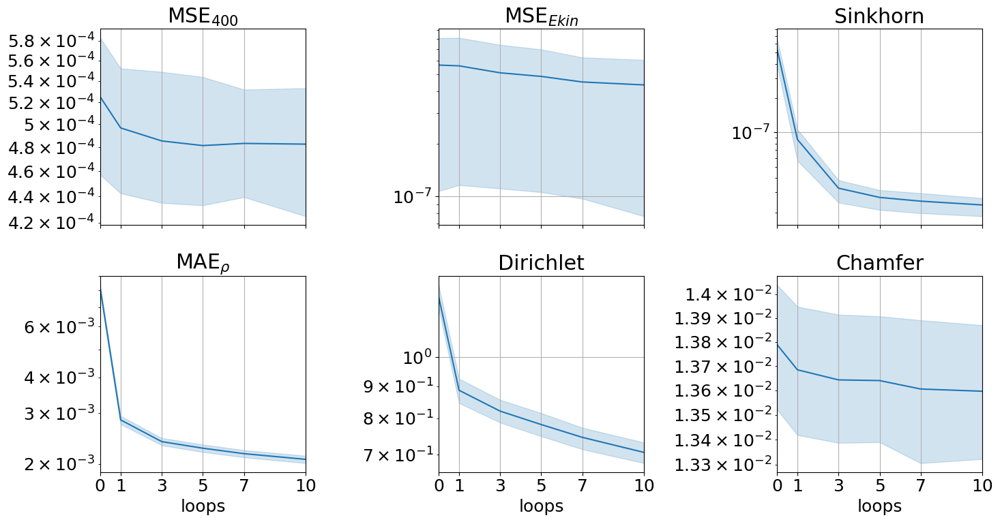

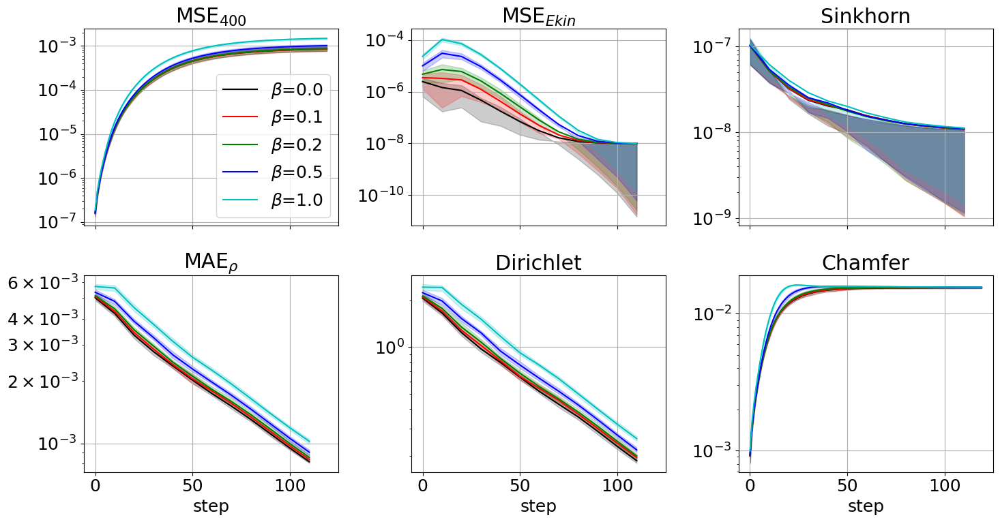

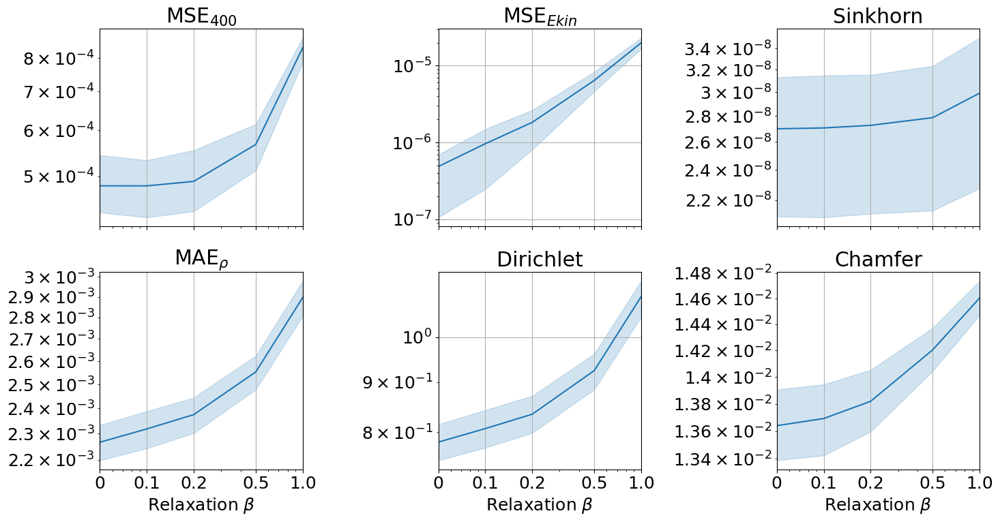

In [21]:
ablate_rlx_tgv2d(rlt_dir)

# 2D TGV SEGNN

In [22]:
rlt_dir = "../rlt/tgv2d_segnn"
# trajs for paper table:
for test_i in ["_0", "_5_002"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])

['val/loss: 4.0e-04', 'val/sinkhorn: 4.4e-07', 'val/e_kin: 3.9e-07']
['val/loss: 3.8e-04', 'val/sinkhorn: 1.5e-08', 'val/e_kin: 2.8e-07']


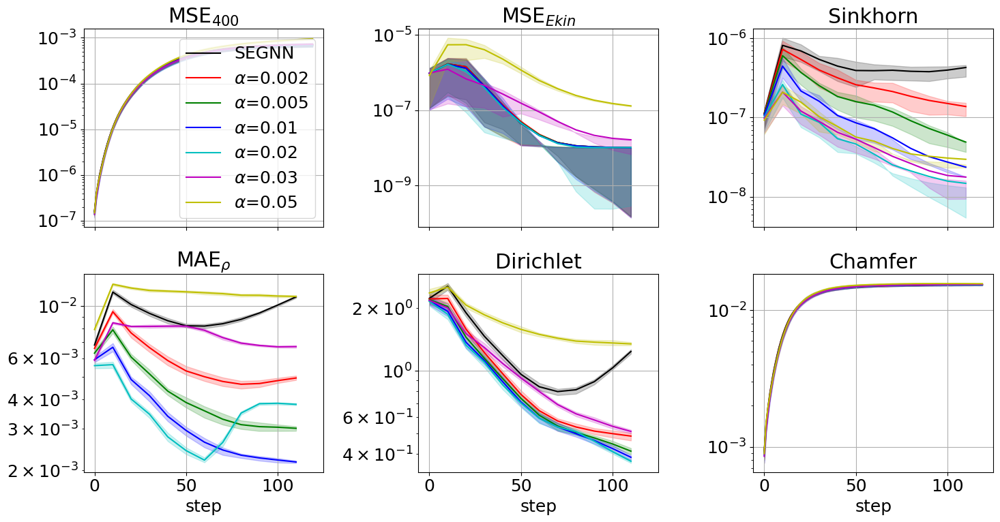

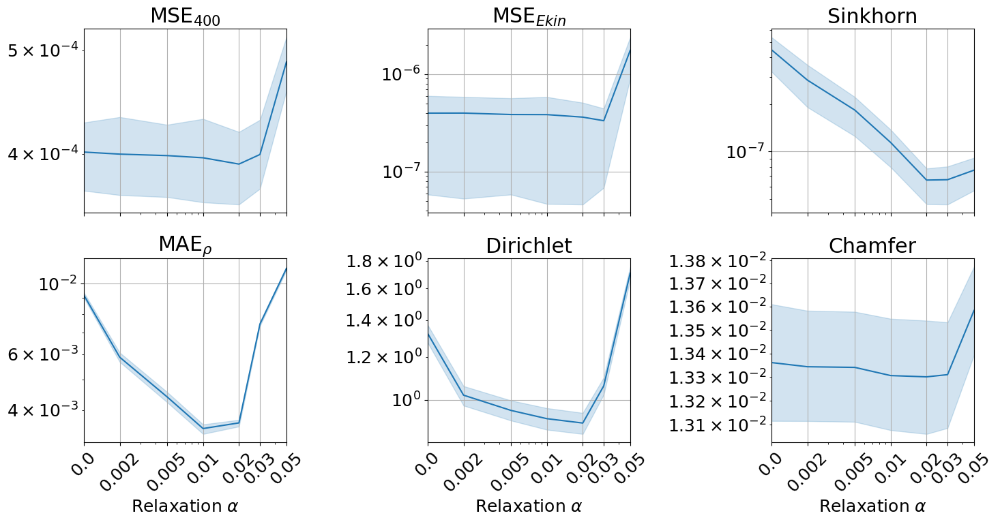

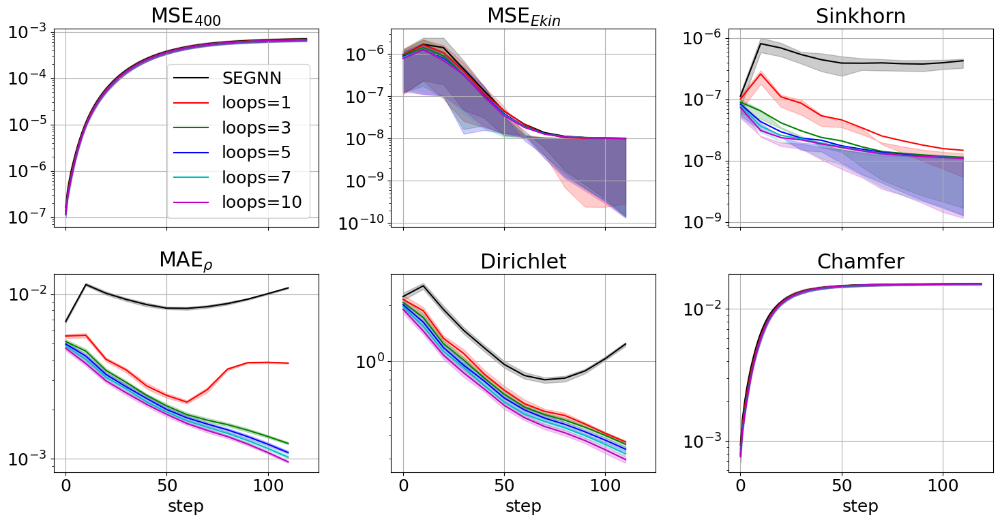

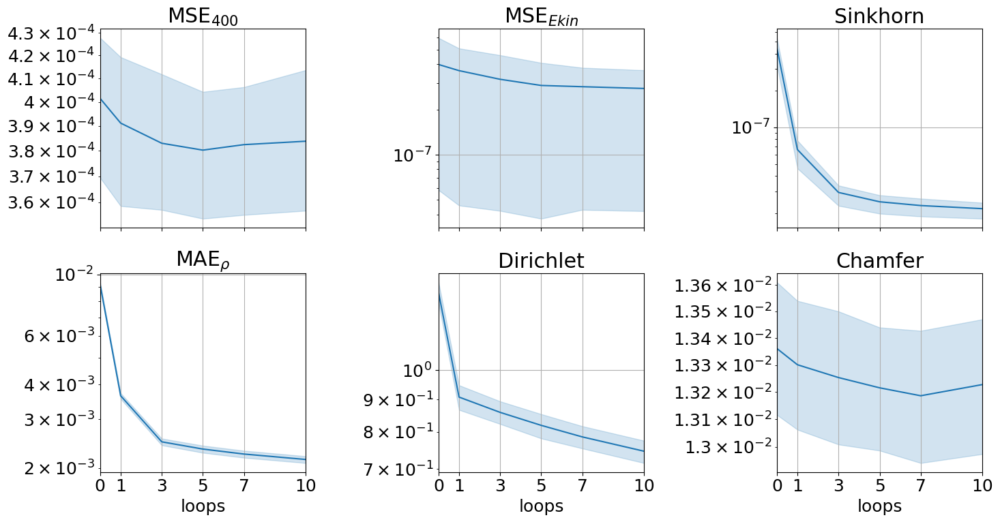

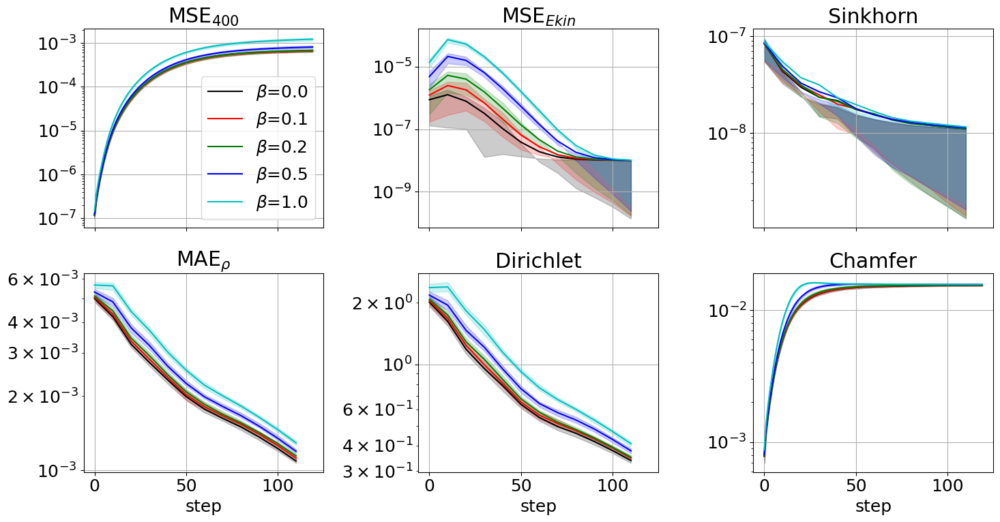

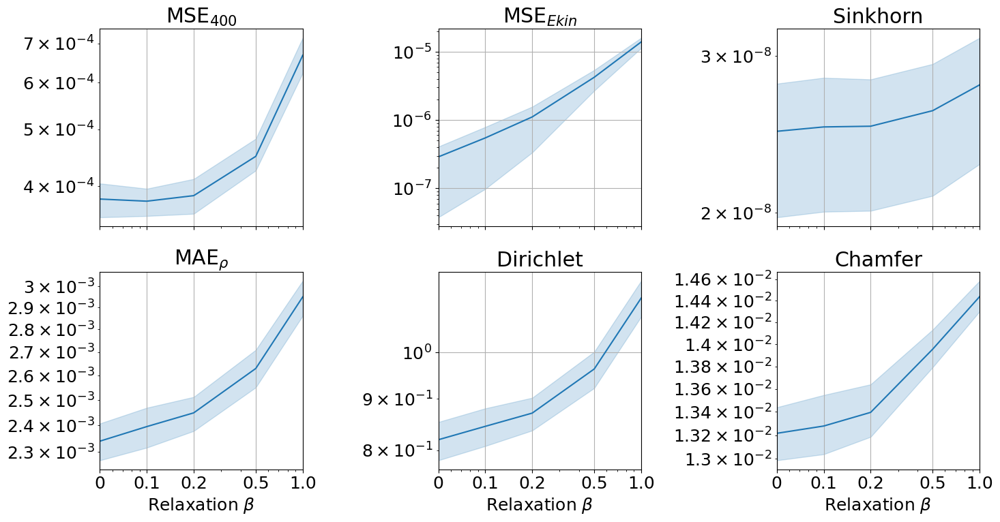

In [23]:
ablate_rlx_tgv2d(rlt_dir)

# 3D TGV GNS

In [24]:
def ablate_rlx_tgv3d(rlt_dir):
    baseline = "SEGNN" if "segnn" in rlt_dir.lower() else "GNS"
    # alphas (acceleration)
    # dirs = ["_0", "_1_0001", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    # labels = [baseline, r"$\alpha$=0.001", r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    dirs = ["_0", "_1_0002", "_1_0005", "_1_001", "_1_002", "_1_003", "_1_005"]
    labels = [baseline, r"$\alpha$=0.002", r"$\alpha$=0.005", r"$\alpha$=0.01", r"$\alpha$=0.02", r"$\alpha$=0.03", r"$\alpha$=0.05"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="alphas")
    # x_axis = [5.e-4, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    # x_ticklabels = [0.0, 1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_axis = [1.e-3, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_ticklabels = [0.0, 2.e-3, 5.e-3, 1.e-2, 2.e-2, 3.e-2, 5.e-2]
    x_label = r"Relaxation $\alpha$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], rotate_x_ticks=True, save_name="alphas_ave")
    # num loops
    dirs = ["_0", "_1_001", "_3_001", "_5_001", "_7_001", "_10_001"]
    labels = [baseline, "loops=1", "loops=3", "loops=5", "loops=7", "loops=10"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="loops")
    x_axis = [0, 1, 3, 5, 7, 10]
    plot_grid_search(rlt_dir, dirs, x_axis, x_label="loops", log=[False, True],
                    save_name="loops_ave")
    # betas (viscosity)
    dirs = ["_1_001", "_1_001_01", "_1_001_02", "_1_001_05", "_1_001_10"]
    labels = [r"$\beta$=0.0", r"$\beta$=0.1", r"$\beta$=0.2", r"$\beta$=0.5", r"$\beta$=1.0"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="betas")
    x_axis = [0.05, 0.1, 0.2, 0.5, 1.0]
    x_ticklabels = [0, 0.1, 0.2, 0.5, 1.0]
    x_label = r"Relaxation $\beta$"
    plot_grid_search(rlt_dir, dirs, x_axis, x_ticklabels=x_ticklabels, x_label=x_label, 
                     log=[True, True], save_name="betas_ave")
    
rlt_dir = "../rlt/tgv3d_gns"

for test_i in ["_0", "_1_001"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])
    

['val/loss: 4.8e-02', 'val/sinkhorn: 4.1e-06', 'val/e_kin: 3.6e-02']
['val/loss: 4.6e-02', 'val/sinkhorn: 9.0e-07', 'val/e_kin: 4.2e-02']


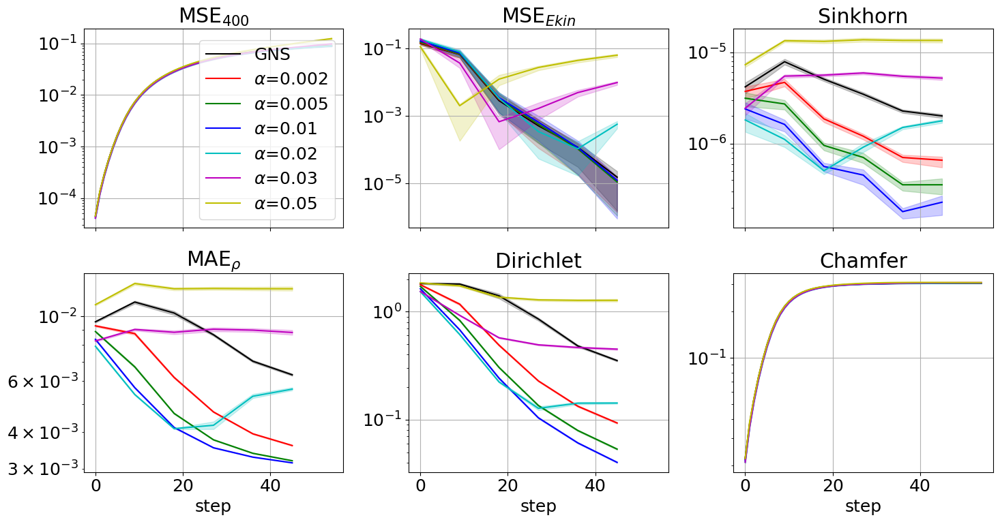

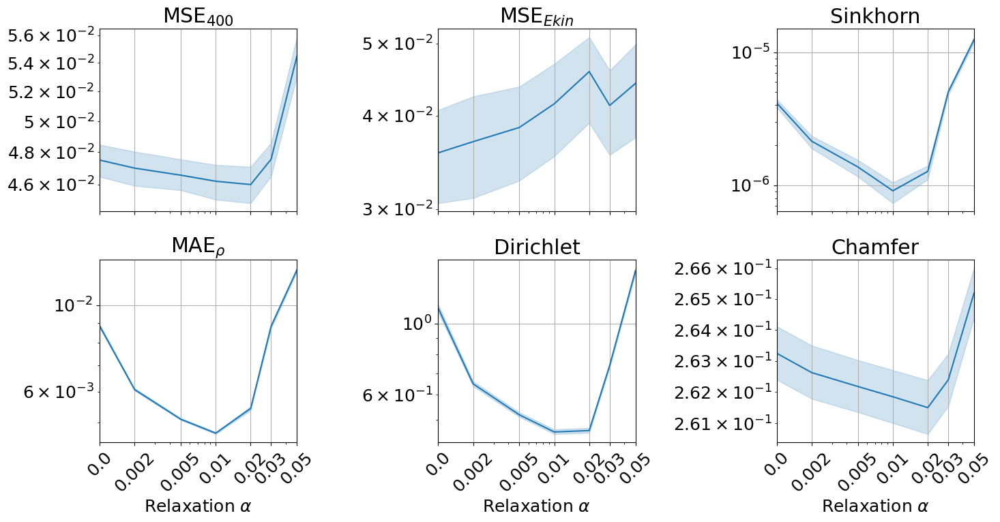

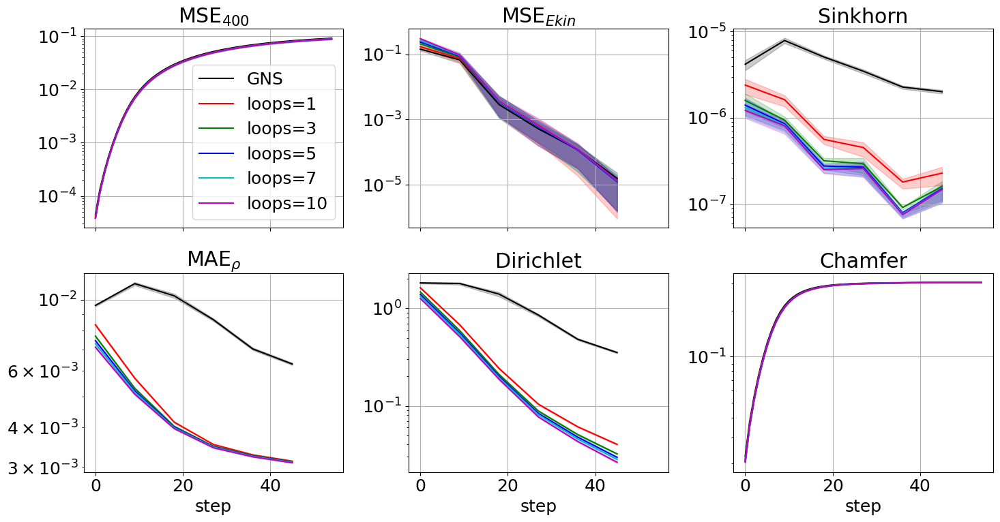

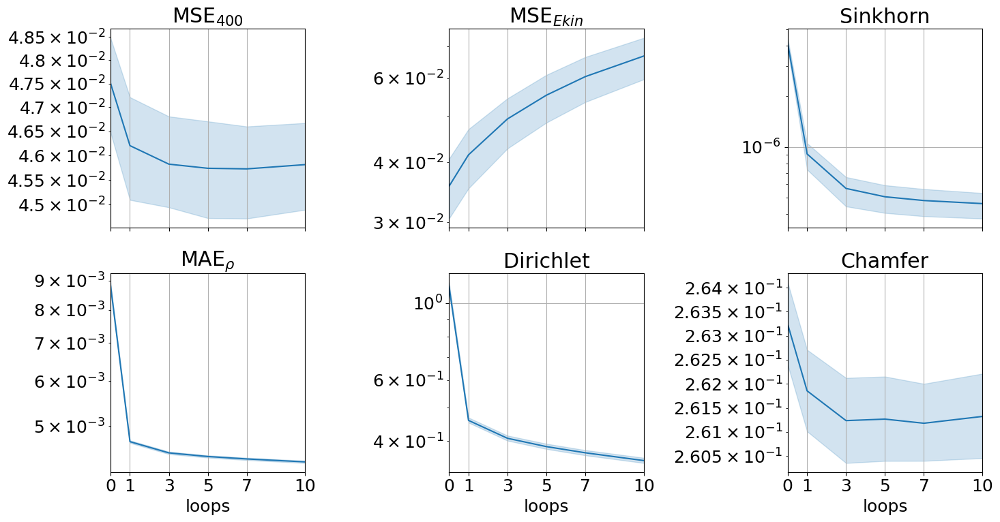

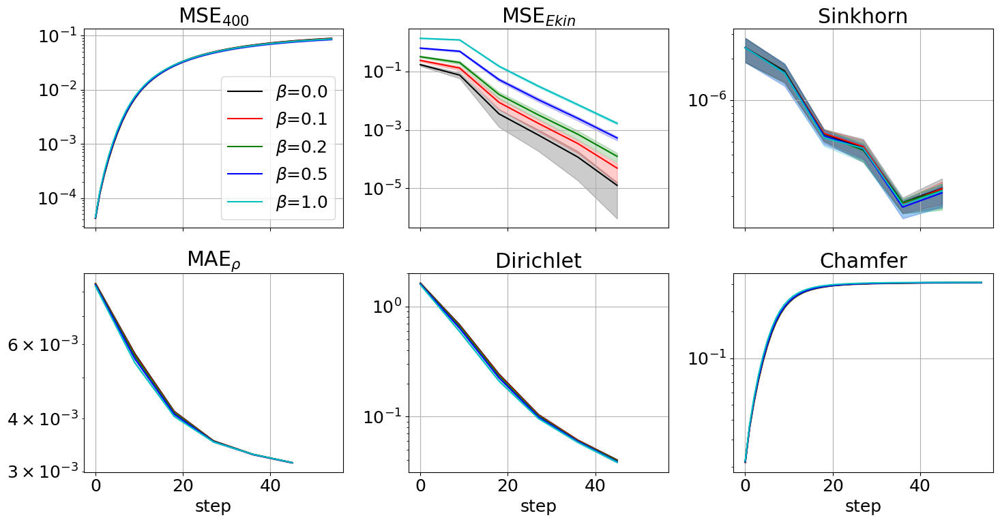

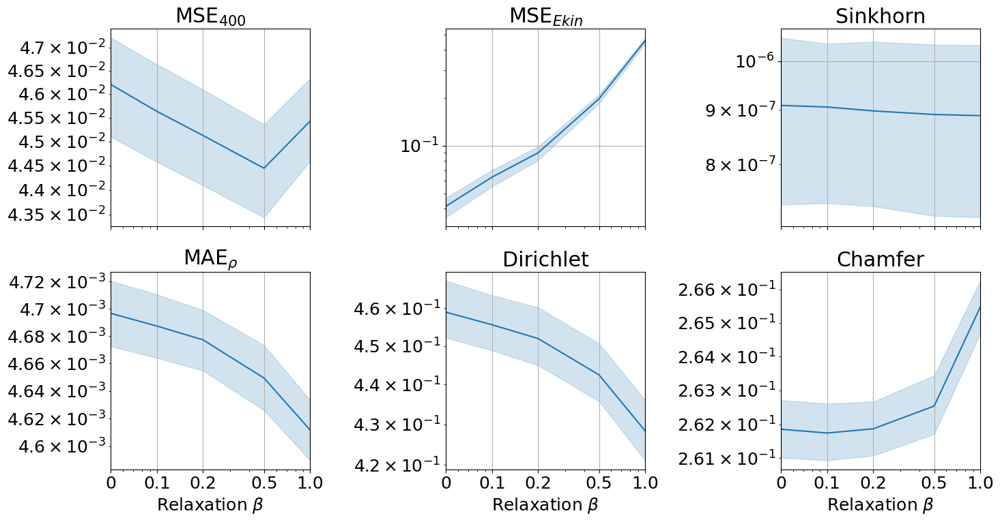

In [25]:
ablate_rlx_tgv3d(rlt_dir)

# 3D TGV SEGNN

In [26]:
rlt_dir = "../rlt/tgv3d_segnn"
for test_i in ["_0", "_1_001"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])


['val/loss: 4.2e-02', 'val/sinkhorn: 6.1e-06', 'val/e_kin: 2.4e-02']
['val/loss: 4.1e-02', 'val/sinkhorn: 6.0e-07', 'val/e_kin: 2.7e-02']


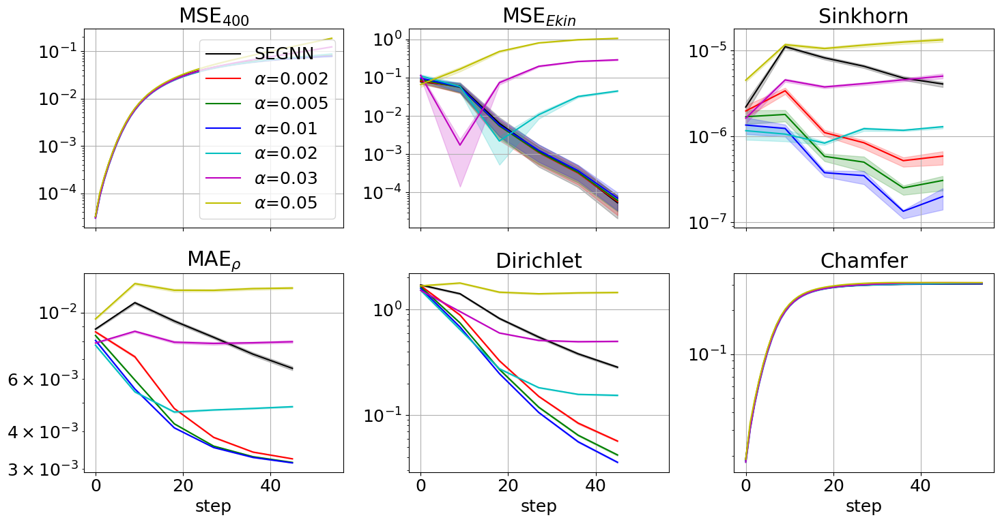

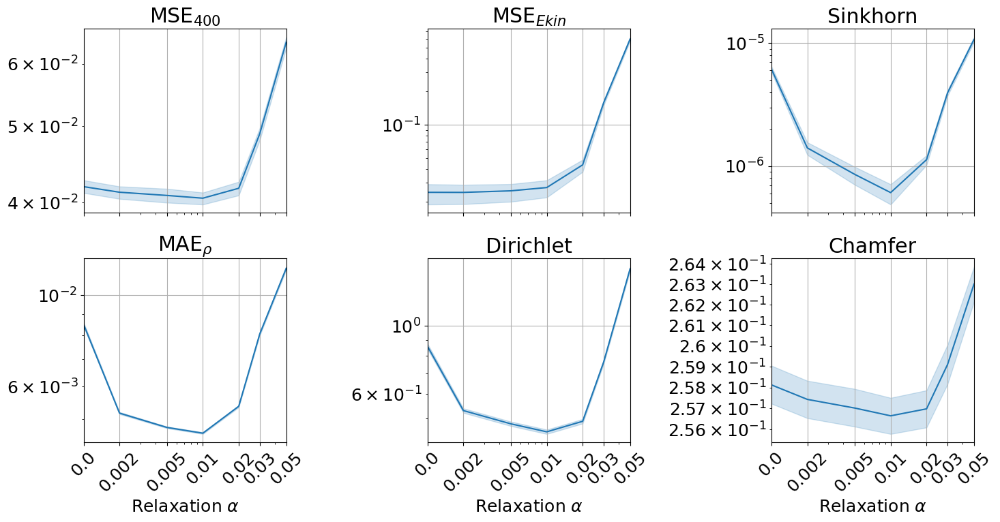

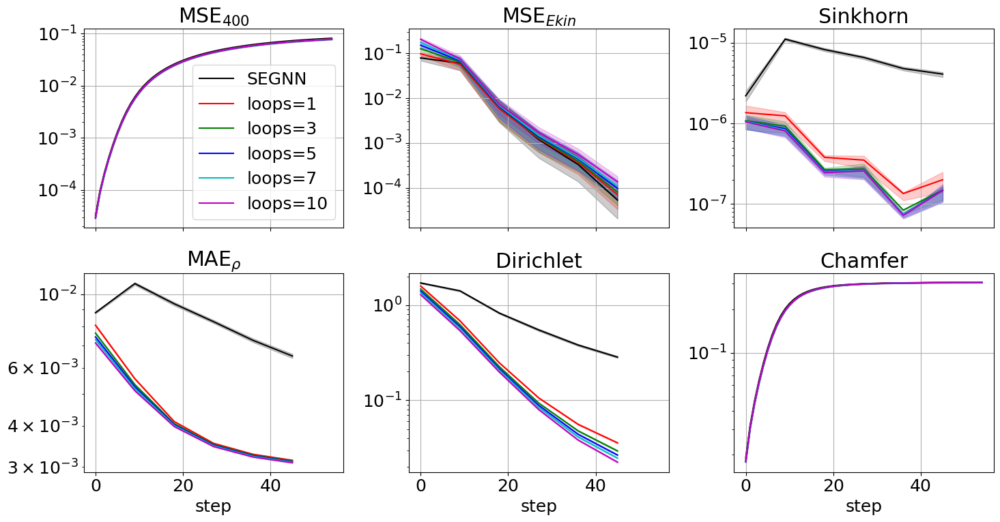

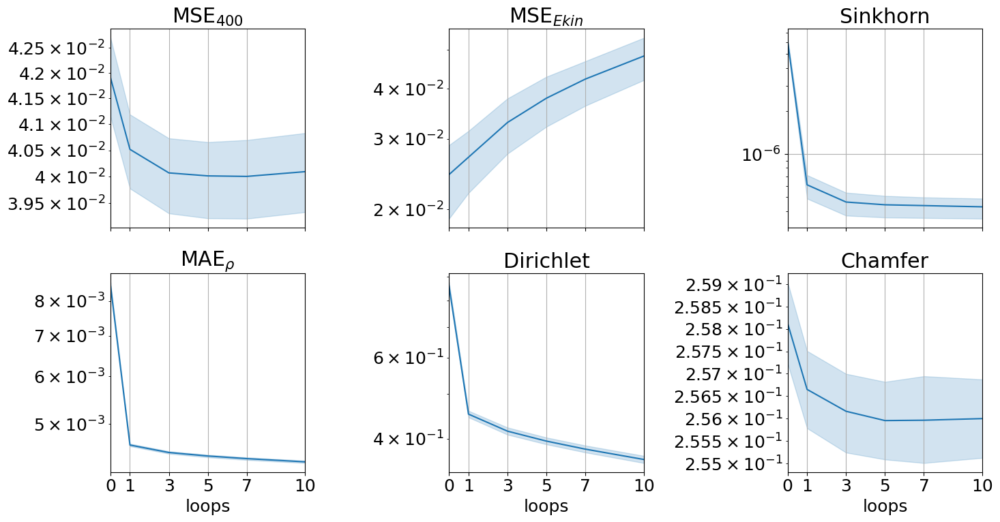

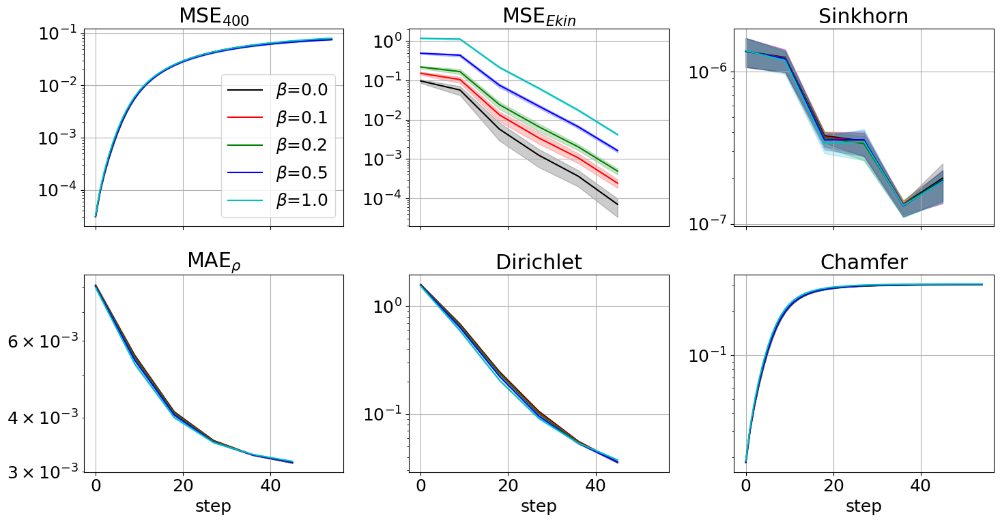

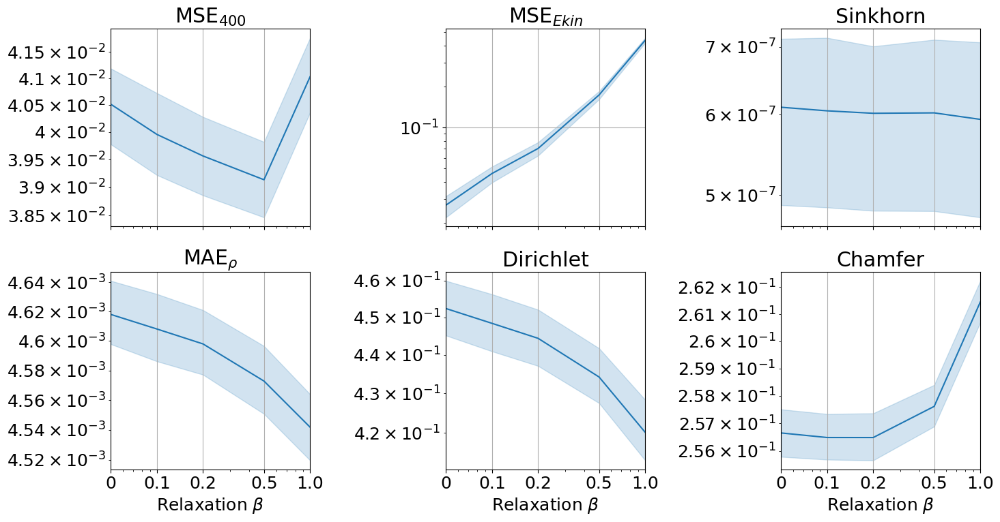

In [27]:
ablate_rlx_tgv3d(rlt_dir)

# 2D DAM GNS

In [28]:
rlt_dir = "../rlt/dam2d_gns"

# trajs for paper table:
for test_i in ["_0", "_ext_0", "_3_003", "_ext_3_003"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])

['val/loss: 1.2e-01', 'val/sinkhorn: 2.2e-02', 'val/e_kin: 7.1e-03']
['val/loss: 7.9e-02', 'val/sinkhorn: 1.4e-02', 'val/e_kin: 9.2e-03']
['val/loss: 9.7e-02', 'val/sinkhorn: 7.1e-03', 'val/e_kin: 5.8e-03']
['val/loss: 8.6e-02', 'val/sinkhorn: 7.2e-03', 'val/e_kin: 2.4e-03']


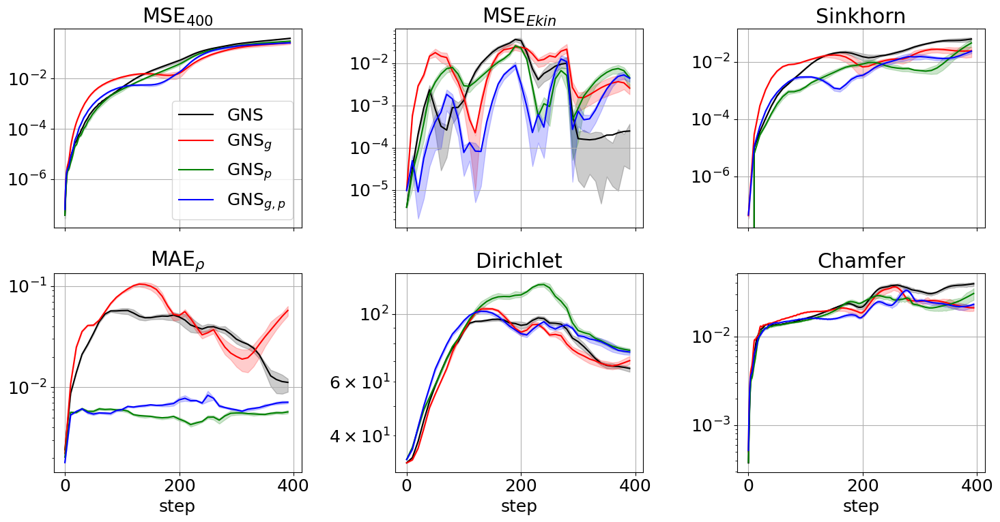

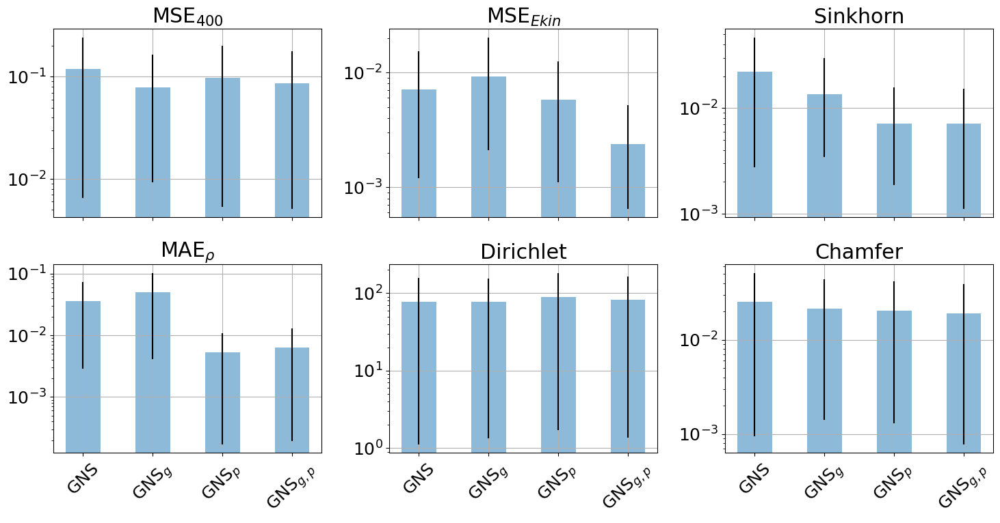

In [29]:
def ablate_dam2d(rlt_dir):
    bl = "SEGNN" if "segnn" in rlt_dir.lower() else "GNS"
    dirs = ["_0", "_ext_0", "_3_003", "_ext_3_003"]
    labels = [bl, bl + r"$_{g}$", bl + r"$_{p}$", bl + r"$_{g,p}$"]
    plot_stats(dirs, rlt_dir, labels=labels, save_name="ext")
    plot_grid_search_bars(rlt_dir, dirs, labels, rotate_x_ticks=45, save_name="ext_bars")

ablate_dam2d(rlt_dir)

# 2D DAM SEGNN

In [30]:
rlt_dir = "../rlt/dam2d_segnn"
# trajs for paper table:
for test_i in ["_0", "_ext_0", "_3_003", "_ext_3_003"]:
    metrics_ave = get_metrics_ave(rlt_dir, test_i, ["val/loss", "val/sinkhorn", "val/e_kin"])
    print([f"{k}: {metrics_ave[k]:.1e}" for k, v in metrics_ave.items()])

['val/loss: 1.2e-01', 'val/sinkhorn: 2.7e-02', 'val/e_kin: 9.7e-03']
['val/loss: 1.5e-01', 'val/sinkhorn: 1.8e-02', 'val/e_kin: 2.1e+01']
['val/loss: 1.2e-01', 'val/sinkhorn: 9.4e-03', 'val/e_kin: 1.2e-02']
['val/loss: 8.7e-02', 'val/sinkhorn: 4.7e-03', 'val/e_kin: 2.5e-03']


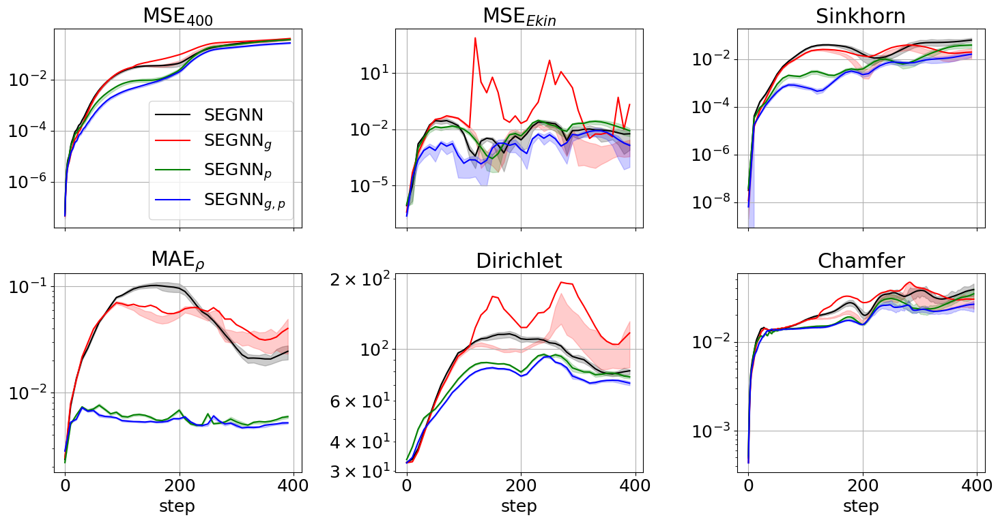

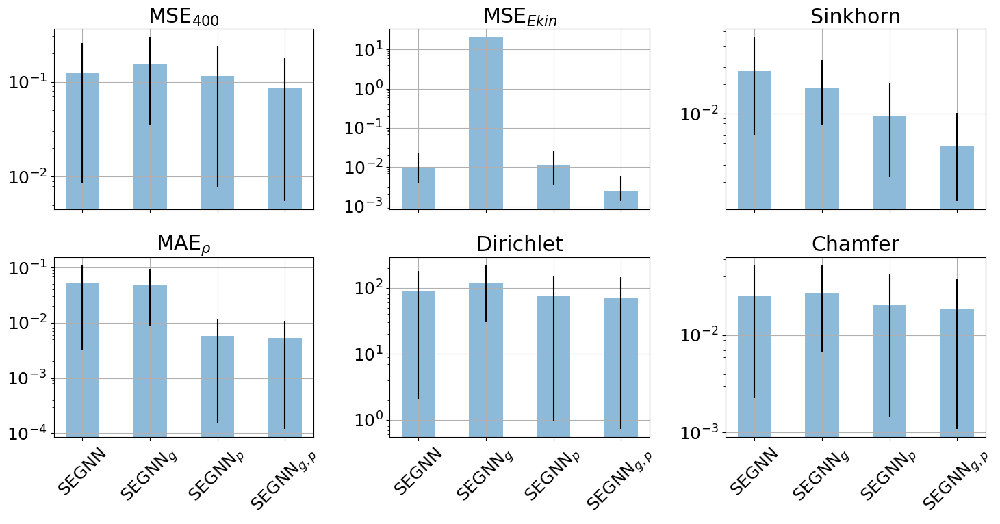

In [31]:
ablate_dam2d(rlt_dir)